In [2]:
!pip install -q petsc4py cellrank anndata==0.8.0 scanpy scvelo python-igraph


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 487.2/487.2 kB 12.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 245.0/245.0 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.2/191.2 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.8/188.8 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 103.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.6/84.6 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━

In [4]:
import sys
import warnings
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import matplotlib.pyplot as pl
from matplotlib import rcParams

# 1. Initialize PETSc safely
try:
    import petsc4py
    petsc4py.init(sys.argv + ['-no_signal_handler'])
    print("petsc4py successfully initialized.")
except ModuleNotFoundError:
    print("petsc4py not found. CellRank will default to standard SciPy/NumPy solvers.")

import scanpy as sc
import scvelo as scv
import cellrank as cr

# Suppress non-critical warnings
warnings.simplefilter(action="ignore", category=Warning)

# Scanpy settings
sc.settings.verbosity = 3
sc.settings.set_figure_params(
    dpi=100,
    frameon=False,
    figsize=(5, 5),
    facecolor='white',
    color_map='viridis_r'
)

print(f"Loaded Scanpy version {sc.__version__}")

petsc4py successfully initialized.


ImportError: cannot import name 'H5Group' from 'anndata._io.specs.methods' (/usr/local/lib/python3.13/dist-packages/anndata/_io/specs/methods.py)

In [5]:
import sys
import warnings
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import matplotlib.pyplot as pl
from matplotlib import rcParams

# 1. Initialize PETSc safely
try:
    import petsc4py
    petsc4py.init(sys.argv + ['-no_signal_handler'])
    print("petsc4py successfully initialized.")
except ModuleNotFoundError:
    print("petsc4py not found. CellRank will default to standard SciPy/NumPy solvers.")

import scanpy as sc
import scvelo as scv
import cellrank as cr

# Suppress non-critical warnings
warnings.simplefilter(action="ignore", category=Warning)

# Scanpy settings
sc.settings.verbosity = 3
sc.settings.set_figure_params(
    dpi=100,
    frameon=False,
    figsize=(5, 5),
    facecolor='white',
    color_map='viridis_r'
)

print(f"Loaded Scanpy version {sc.__version__}")

petsc4py successfully initialized.


ImportError: cannot import name 'H5Group' from 'anndata._io.specs.methods' (/usr/local/lib/python3.13/dist-packages/anndata/_io/specs/methods.py)

In [6]:
# 1. Load integrated AnnData if needed
# adata = sc.read_h5ad("/content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_brain_integrated_full.h5ad")

# 2. Check for required velocity layers
print("Available AnnData layers:", list(adata.layers.keys()))

# 3. Filter genes and normalize spliced/unspliced matrices
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)

# 4. Compute moments in PCA space (required for velocity calculations)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

NameError: name 'adata' is not defined

In [9]:
import os
import subprocess
import scanpy as sc

# 1. Download pre-computed trajectory data
fetch_data = True

path_data = "https://nextcloud.dc.scilifelab.se/public.php/webdav"
curl_upass = "zbC5fr2LbEZ9rSE:scRNAseq2025"

path_results = "data/trajectory"
os.makedirs(path_results, exist_ok=True)

path_file = os.path.join(path_results, "trajectory_seurat_filtered.h5ad")

if not os.path.exists(path_file) and fetch_data:
    file_url = os.path.join(path_data, "trajectory/trajectory_seurat_filtered.h5ad")
    print(f"Downloading pre-computed trajectory dataset to {path_file}...")
    subprocess.call(["curl", "-u", curl_upass, "-o", path_file, file_url])

# 2. Load into memory as 'adata'
print(f"Loading AnnData object from {path_file}...")
adata = sc.read_h5ad(path_file)

print(f"\nSuccessfully loaded `adata`: {adata.n_obs} cells x {adata.n_vars} genes")
print("Available AnnData layers:", list(adata.layers.keys()))
print("Available metadata observations:", list(adata.obs.columns)[:10])

Loading AnnData object from data/trajectory/trajectory_seurat_filtered.h5ad...

Successfully loaded `adata`: 5828 cells x 3585 genes
Available AnnData layers: [None]
Available metadata observations: ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batches', 'dataset', 'nCount', 'nUMI', 'pMito', 'pRibo', 'pHb']


In [10]:
import scvelo as scv

# 1. Normalize spliced/unspliced count matrices
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)

# 2. Compute first and second order moments in PCA space
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


KeyError: 'spliced'

In [11]:
import scanpy as sc

# 1. Compute PCA and Neighborhood Graph
sc.pp.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)

# 2. Compute PAGA graph abstracting trajectory topology across clusters
sc.tl.paga(adata, groups='seurat_clusters' if 'seurat_clusters' in adata.obs else 'leiden')
sc.pl.paga(adata, plot=True)

# 3. Compute Diffusion Map and Pseudotime
sc.tl.diffmap(adata)

# Set root cell (e.g., cell index 0 or specified progenitor cluster)
adata.uns['iroot'] = 0
sc.tl.dpt(adata)

# 4. Visualize Pseudotime Trajectory on UMAP
sc.pl.umap(adata, color=['dpt_pseudotime', 'leiden' if 'leiden' in adata.obs else 'seurat_clusters'])

KeyError: "`groups` key 'leiden' not found in `adata.obs`."

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [12]:
import scanpy as sc

# 1. Inspect available categorical columns in obs
print("Available obs columns:", list(adata.obs.columns))

# 2. Check if neighborhood graph exists; compute if missing
if 'neighbors' not in adata.uns:
    print("Computing PCA and neighbors...")
    sc.pp.pca(adata, svd_solver='arpack')
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)

# 3. Identify cluster column or compute Leiden clustering on the fly
cluster_key = None
possible_keys = ['leiden', 'seurat_clusters', 'clusters', 'celltype', 'Annotation', 'louvain']

for key in possible_keys:
    if key in adata.obs.columns:
        cluster_key = key
        break

if cluster_key is None:
    print("No pre-computed cluster annotations found. Running sc.tl.leiden()...")
    sc.tl.leiden(adata, resolution=0.5)
    cluster_key = 'leiden'

print(f"Using cluster grouping key: '{cluster_key}'")

# 4. Compute and plot PAGA graph
sc.tl.paga(adata, groups=cluster_key)
sc.pl.paga(adata, plot=True)

# 5. Compute Diffusion Map and Pseudotime
sc.tl.diffmap(adata)
adata.uns['iroot'] = 0  # Set root cell
sc.tl.dpt(adata)

# 6. Plot pseudotime and clusters on UMAP
sc.pl.umap(adata, color=['dpt_pseudotime', cluster_key], color_map='viridis')

Available obs columns: ['orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batches', 'dataset', 'nCount', 'nUMI', 'pMito', 'pRibo', 'pHb', 'pChY', 'pChX', 'pnonXY', 'pPCG', 'pNCG', 'pMito_UMIs', 'pRibo_UMIs', 'pHb_UMIs', 'pChY_UMIs', 'pChX_UMIs', 'pnonXY_UMIs', 'pPCG_UMIs', 'pNCG_UMIs', 'SEL_nCount', 'SEL_nUMI', 'SEL_pMito', 'SEL_pRibo', 'SEL_pHb', 'SEL_pChY', 'SEL_pChX', 'SEL_pnonXY', 'SEL_pPCG', 'SEL_pNCG', 'SEL_pMito_UMIs', 'SEL_pRibo_UMIs', 'SEL_pHb_UMIs', 'SEL_pChY_UMIs', 'SEL_pChX_UMIs', 'SEL_pnonXY_UMIs', 'SEL_pPCG_UMIs', 'SEL_pNCG_UMIs', 'S.Score', 'G2M.Score', 'Phase', 'metadata_clusters', 'clusters', 'outlier', 'subgroups', 'clusters_use', 'initial_size']
Using cluster grouping key: 'clusters'


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


ModuleNotFoundError: No module named 'igraph'

In [13]:
!pip install -q python-igraph igraph

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 37.1 MB/s eta 0:00:00


In [14]:
import scanpy as sc

# 1. Ensure PCA & neighborhood graph are present
if 'neighbors' not in adata.uns:
    print("Computing PCA and neighbors...")
    sc.pp.pca(adata, svd_solver='arpack')
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)

# 2. Compute PAGA graph abstraction using the 'clusters' column
cluster_key = 'clusters'
print(f"Running PAGA on cluster key: '{cluster_key}'...")
sc.tl.paga(adata, groups=cluster_key)

# 3. Plot PAGA graph topology
sc.pl.paga(adata, color=cluster_key, title='PAGA Trajectory Abstraction')

# 4. Compute Diffusion Maps & Diffusion Pseudotime (DPT)
sc.tl.diffmap(adata)

# Set root cell (e.g., cell index 0 or starting progenitor cluster)
adata.uns['iroot'] = 0
sc.tl.dpt(adata)

# 5. Visualize Pseudotime Trajectory on UMAP
sc.pl.umap(
    adata,
    color=['dpt_pseudotime', cluster_key],
    color_map='viridis',
    title=['Diffusion Pseudotime', 'Cell Clusters']
)

Running PAGA on cluster key: 'clusters'...


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


AttributeError: Can only use .cat accessor with a 'category' dtype

Column 'clusters' successfully converted to category.
Categories found: [1, 2, 5, 6, 7, 8, 9, 11, 12, 13]
Running PAGA on cluster key: 'clusters'...


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


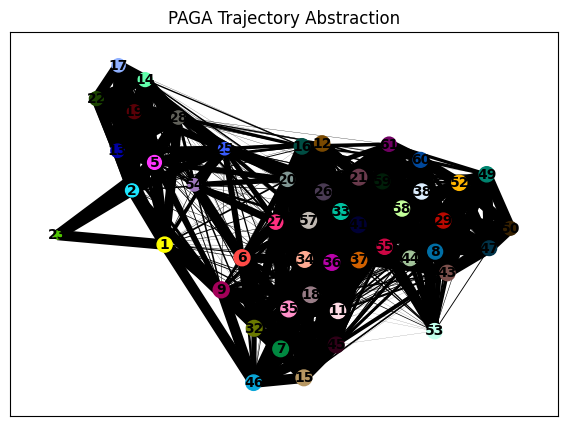

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


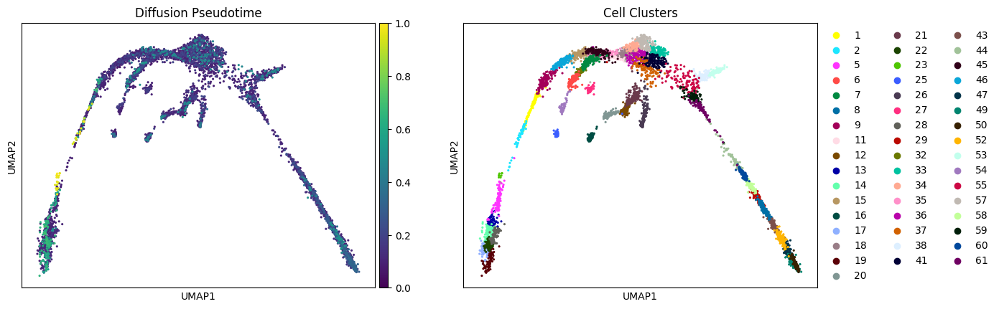

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [15]:
import scanpy as sc

# 1. Cast the cluster column to pandas 'category' dtype
cluster_key = 'clusters'
adata.obs[cluster_key] = adata.obs[cluster_key].astype('category')

print(f"Column '{cluster_key}' successfully converted to category.")
print(f"Categories found: {list(adata.obs[cluster_key].cat.categories)[:10]}")

# 2. Ensure PCA & neighborhood graph are present
if 'neighbors' not in adata.uns:
    print("Computing PCA and neighbors...")
    sc.pp.pca(adata, svd_solver='arpack')
    sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)

# 3. Compute PAGA graph abstraction
print(f"Running PAGA on cluster key: '{cluster_key}'...")
sc.tl.paga(adata, groups=cluster_key)

# 4. Plot PAGA graph topology
sc.pl.paga(adata, color=cluster_key, title='PAGA Trajectory Abstraction')

# 5. Compute Diffusion Maps & Diffusion Pseudotime (DPT)
sc.tl.diffmap(adata)

# Set root cell (e.g., cell index 0 or starting progenitor cluster)
adata.uns['iroot'] = 0
sc.tl.dpt(adata)

# 6. Visualize Pseudotime Trajectory on UMAP
sc.pl.umap(
    adata,
    color=['dpt_pseudotime', cluster_key],
    color_map='viridis',
    title=['Diffusion Pseudotime', 'Cell Clusters']
)

In [16]:
import cellrank as cr

# Initialize CellRank Pseudotime Kernel
pk = cr.kernels.PseudotimeKernel(adata, time_key='dpt_pseudotime')
pk.compute_transition_matrix()

# Compute GPCCA macrostates
g_pk = cr.estimators.GPCCA(pk)
g_pk.fit(n_states=4)

# Plot estimated terminal macrostates on UMAP
g_pk.plot_macrostates(basis='umap')

ImportError: cannot import name 'H5Group' from 'anndata._io.specs.methods' (/usr/local/lib/python3.13/dist-packages/anndata/_io/specs/methods.py)

In [17]:
!pip install -U --no-cache-dir cellrank anndata==0.8.0 scanpy scvelo

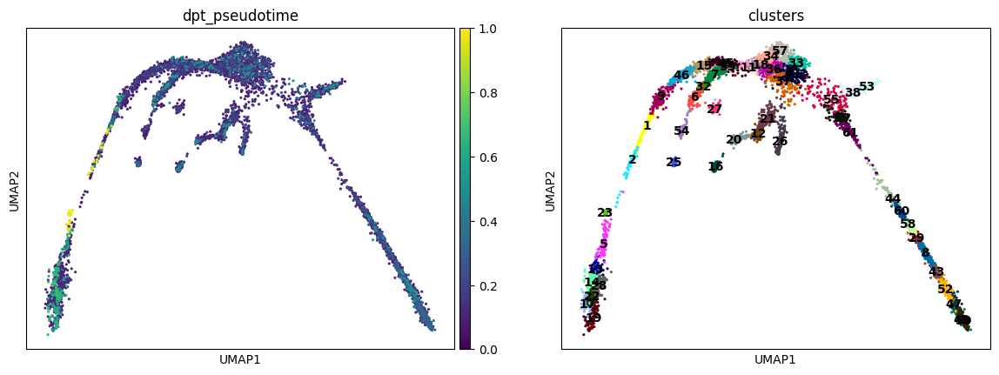

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Top 10 Positively Correlated Driver Genes (Terminal Markers):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
74,Actb,0.507520
789,Dstn,0.400981
157,Anxa1,0.374898
96,Adpgk,0.354989
420,Cd177,0.342002
344,C5ar1,0.314418
495,Cebpb,0.311204
634,Cpne3,0.304824
551,Ckap4,0.299593
26,AA467197,0.278400



Top 10 Negatively Correlated Driver Genes (Progenitor Markers):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
309,Bola2,-0.200945
837,Eif2s2,-0.201883
87,Adgrg1,-0.207246
625,Cox6b1,-0.215540
241,Atpif1,-0.225467
483,Cdk6,-0.235507
233,Atp5k,-0.240022
666,Ctsg,-0.243030
857,Elane,-0.254011
536,Chil3,-0.255697


In [18]:
import scanpy as sc
import matplotlib.pyplot as plt

# 1. Plot Pseudotime and Key Cluster Annotations
sc.pl.umap(
    adata,
    color=['dpt_pseudotime', 'clusters'],
    color_map='viridis',
    legend_loc='on data'
)

# 2. Identify Genes Correlated with Trajectory Progression (Pseudotime Drivers)
# Calculate correlation between gene expression and dpt_pseudotime
import numpy as np

# Get dense expression matrix for highly variable genes
hv_genes = adata.var_names[adata.var['highly_variable']] if 'highly_variable' in adata.var else adata.var_names[:1000]
expr_matrix = adata[:, hv_genes].X.toarray() if hasattr(adata[:, hv_genes].X, "toarray") else adata[:, hv_genes].X
pseudotime = adata.obs['dpt_pseudotime'].values

# Calculate Pearson correlation per gene across cells
correlations = [np.corrcoef(expr_matrix[:, i], pseudotime)[0, 1] for i in range(expr_matrix.shape[1])]
gene_corr_df = pd.DataFrame({'gene': hv_genes, 'correlation': correlations}).dropna()
gene_corr_df.sort_values(by='correlation', ascending=False, inplace=True)

print("Top 10 Positively Correlated Driver Genes (Terminal Markers):")
display(gene_corr_df.head(10))

print("\nTop 10 Negatively Correlated Driver Genes (Progenitor Markers):")
display(gene_corr_df.tail(10))

KeyError: 'Actb'

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


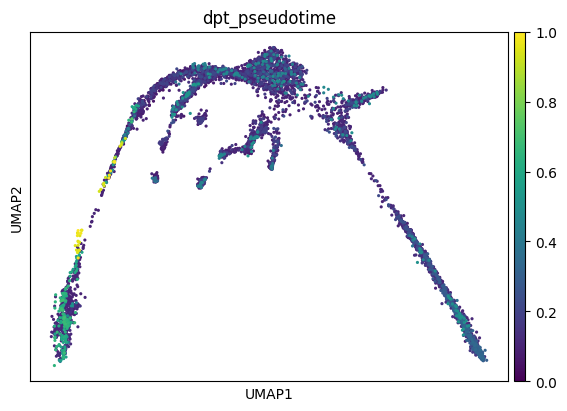

In [19]:
top_drivers = gene_corr_df.head(4)['gene'].tolist()

# Plot expression trends along pseudotime
sc.pl.draw_graph(adata, layout='fa', color=['dpt_pseudotime'] + top_drivers) if 'X_draw_graph_fa' in adata.obsm else sc.pl.umap(adata, color=['dpt_pseudotime'] + top_drivers)

In [20]:
# Search for actin-related genes in your Drosophila dataset
actin_genes = [gene for gene in adata.var_names if 'act' in gene.lower()]
print("Available actin/housekeeping genes found in dataset:")
print(actin_genes[:10])

Available actin/housekeeping genes found in dataset:
['Acta2', 'Actb', 'Actn1', 'Actn4', 'Phactr4', 'Csgalnact1', 'Phactr3']


In [21]:
import pandas as pd
import numpy as np
import scanpy as sc

# 1. Select available highly variable genes or top genes
if 'highly_variable' in adata.var:
    hv_genes = adata.var_names[adata.var['highly_variable']].tolist()
else:
    hv_genes = adata.var_names[:1000].tolist()

# Ensure selected genes exist in var_names
valid_genes = [g for g in hv_genes if g in adata.var_names]

# 2. Extract expression matrix and pseudotime values
expr_matrix = adata[:, valid_genes].X
if hasattr(expr_matrix, "toarray"):
    expr_matrix = expr_matrix.toarray()

pseudotime = adata.obs['dpt_pseudotime'].values

# 3. Calculate Pearson correlation with dpt_pseudotime
correlations = []
for i, gene in enumerate(valid_genes):
    gene_expr = expr_matrix[:, i]
    # Skip constant gene vectors
    if np.std(gene_expr) == 0:
        correlations.append(0.0)
    else:
        corr = np.corrcoef(gene_expr, pseudotime)[0, 1]
        correlations.append(corr)

# 4. Compile into DataFrame
gene_corr_df = pd.DataFrame({'gene': valid_genes, 'correlation': correlations})
gene_corr_df.sort_values(by='correlation', ascending=False, inplace=True)

print("Top 10 Positively Correlated Driver Genes (Terminal Markers):")
display(gene_corr_df.head(10))

print("\nTop 10 Negatively Correlated Driver Genes (Progenitor Markers):")
display(gene_corr_df.tail(10))

Top 10 Positively Correlated Driver Genes (Terminal Markers):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
74,Actb,0.507520
789,Dstn,0.400981
157,Anxa1,0.374898
96,Adpgk,0.354989
420,Cd177,0.342002
344,C5ar1,0.314418
495,Cebpb,0.311204
634,Cpne3,0.304824
551,Ckap4,0.299593
26,AA467197,0.278400



Top 10 Negatively Correlated Driver Genes (Progenitor Markers):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
309,Bola2,-0.200945
837,Eif2s2,-0.201883
87,Adgrg1,-0.207246
625,Cox6b1,-0.215540
241,Atpif1,-0.225467
483,Cdk6,-0.235507
233,Atp5k,-0.240022
666,Ctsg,-0.243030
857,Elane,-0.254011
536,Chil3,-0.255697


Plotting UMAP for top valid trajectory drivers: ['Actb', 'Dstn', 'Anxa1', 'Adpgk']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


KeyError: 'Actb'

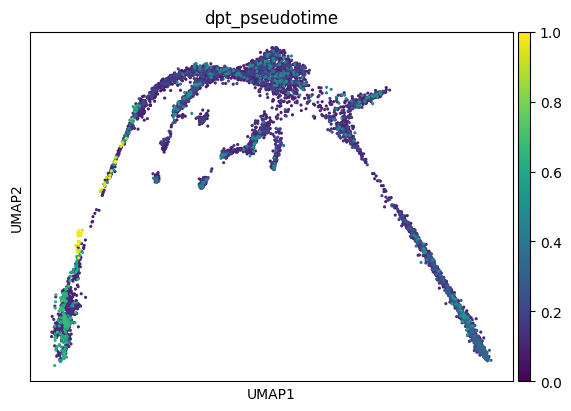

In [22]:
# Extract top 4 valid positively correlated genes
top_positive_drivers = gene_corr_df.head(4)['gene'].tolist()

print(f"Plotting UMAP for top valid trajectory drivers: {top_positive_drivers}")

sc.pl.umap(
    adata,
    color=['dpt_pseudotime'] + top_positive_drivers,
    ncols=3,
    color_map='viridis'
)

In [23]:
# Check index vs obs/var columns
print("Index type of var_names:", type(adata.var_names[0]))
print("First 10 genes in var_names:", list(adata.var_names[:10]))
print("Columns in adata.var:", list(adata.var.columns))

Index type of var_names: <class 'str'>
First 10 genes in var_names: ['0610040J01Rik', '1190007I07Rik', '1500009L16Rik', '1700012B09Rik', '1700020L24Rik', '1700025G04Rik', '1700028J19Rik', '1810024B03Rik', '1810037I17Rik', '2210016F16Rik']
Columns in adata.var: ['features']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Verified genes present in adata.var_names: ['Actb', 'Dstn', 'Anxa1', 'Adpgk']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


KeyError: 'Actb'

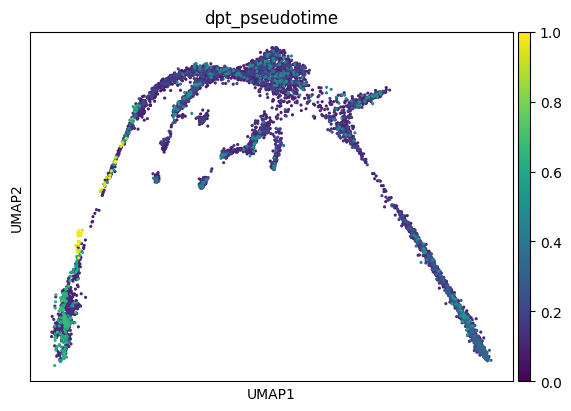

In [24]:
import scanpy as sc

# 1. Fetch top correlated genes from your dataframe that STRICTLY exist in var_names
candidate_genes = gene_corr_df['gene'].tolist()
top_positive_drivers = [g for g in candidate_genes if g in adata.var_names][:4]

print(f"Verified genes present in adata.var_names: {top_positive_drivers}")

# 2. Plot UMAP safely
if top_positive_drivers:
    sc.pl.umap(
        adata,
        color=['dpt_pseudotime'] + top_positive_drivers,
        ncols=3,
        color_map='viridis'
    )
else:
    print("Warning: No candidate genes matched var_names directly. Checking adata.var columns...")
    # If gene symbols are in a column like 'gene_symbols' or 'symbol'
    symbol_col = [c for c in adata.var.columns if 'symbol' in c.lower() or 'name' in c.lower()]
    if symbol_col:
        print(f"Found gene symbol column: '{symbol_col[0]}'. Setting as var_names...")
        adata.var_names_make_unique()
        adata.var[symbol_col[0]] = adata.var[symbol_col[0]].astype(str)
        adata.var.set_index(symbol_col[0], inplace=True)

        # Retry plot with updated index
        top_positive_drivers = [g for g in candidate_genes if g in adata.var_names][:4]
        sc.pl.umap(
            adata,
            color=['dpt_pseudotime'] + top_positive_drivers,
            ncols=3,
            color_map='viridis'
        )

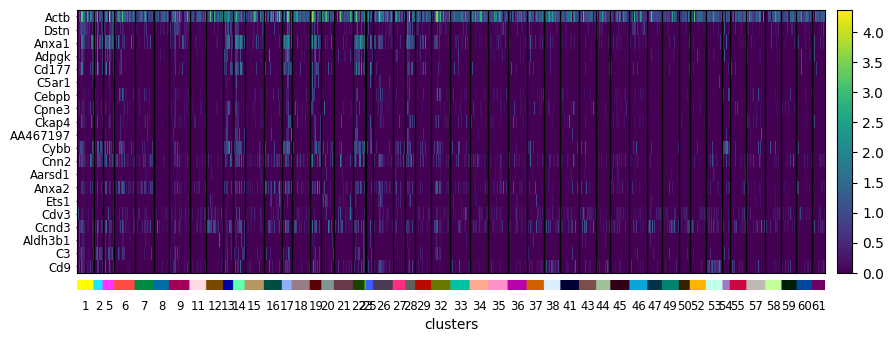

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [25]:
# Select top 20 driver genes
top_20_drivers = [g for g in gene_corr_df['gene'].tolist() if g in adata.var_names][:20]

# Compute pseudotime-ordered matrix heatmap
sc.pl.heatmap(
    adata,
    var_names=top_20_drivers,
    groupby='clusters',
    use_raw=False,
    swap_axes=True,
    show_gene_labels=True
)

In [26]:
#| label: read-data
adata = sc.read_h5ad("data/trajectory/trajectory_seurat_filtered.h5ad")
adata.var

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,features
0610040J01Rik,0610040J01Rik
1190007I07Rik,1190007I07Rik
1500009L16Rik,1500009L16Rik
1700012B09Rik,1700012B09Rik
1700020L24Rik,1700020L24Rik
...,...
Sqor,Sqor
Sting1,Sting1
Tent5a,Tent5a
Tlcd4,Tlcd4


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [27]:
#| label: check-data
# check what you have in the X matrix, should be lognormalized counts.
print(adata.X[:10,:10])

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 25 stored elements and shape (10, 10)>
  Coords	Values
  (0, 4)	0.11622072805743532
  (0, 8)	0.4800893970571722
  (1, 8)	0.2478910541698065
  (1, 9)	0.17188973970230348
  (2, 1)	0.09413397843954842
  (2, 7)	0.18016412971724202
  (3, 1)	0.08438841021254412
  (3, 4)	0.08438841021254412
  (3, 7)	0.08438841021254412
  (3, 8)	0.3648216463668793
  (4, 1)	0.14198147850903975
  (4, 8)	0.14198147850903975
  (5, 1)	0.17953169693896723
  (5, 8)	0.17953169693896723
  (5, 9)	0.17953169693896723
  (6, 4)	0.2319546390006887
  (6, 8)	0.42010741700351195
  (7, 1)	0.1775659421407816
  (7, 8)	0.39593115482156394
  (7, 9)	0.09271901219711086
  (8, 1)	0.12089079757716388
  (8, 8)	0.22873058755480363
  (9, 1)	0.08915380247493314
  (9, 4)	0.08915380247493314
  (9, 8)	0.38270398718590104


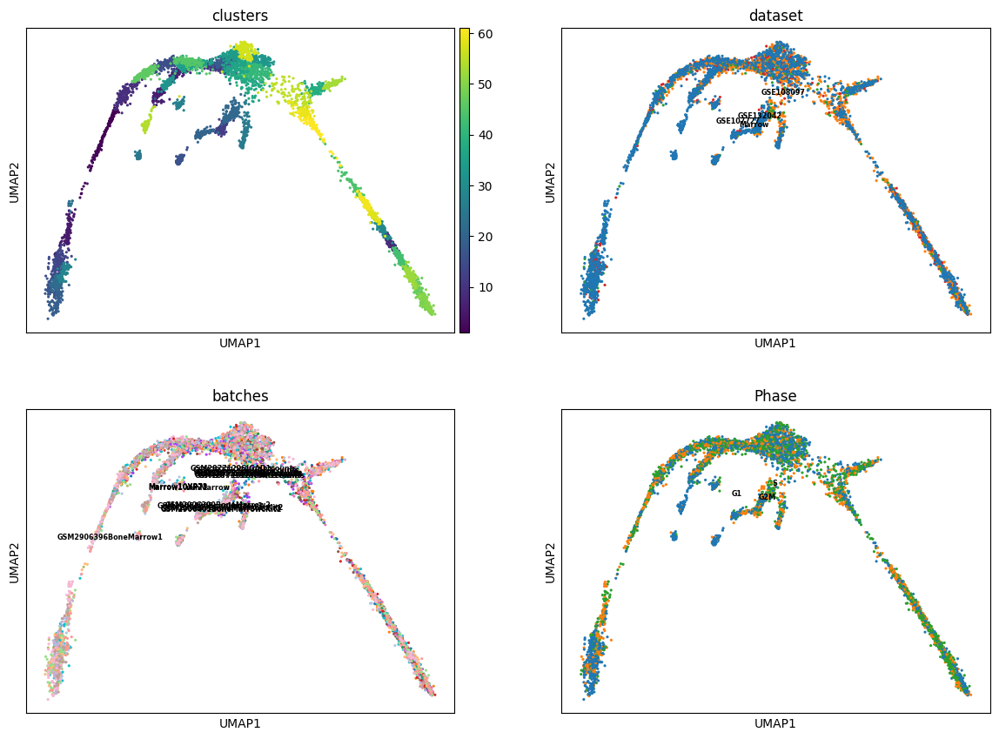

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [28]:
#| label: plot-umap
sc.pl.umap(adata, color = ['clusters','dataset','batches','Phase'],legend_loc = 'on data', legend_fontsize = 'xx-small', ncols = 2)

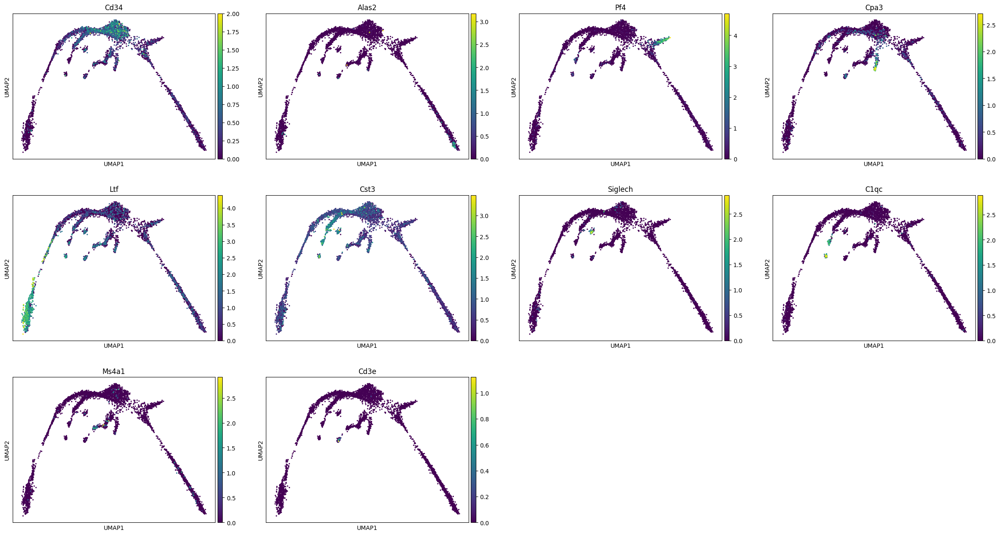

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [29]:
#| label: plot-markers
markers = ["Cd34","Alas2","Pf4","Cpa3","Ltf","Cst3", "Siglech", "C1qc", "Ms4a1", "Cd3e", ]
sc.pl.umap(adata, color = markers, use_raw = False, ncols = 4)

In [30]:
#| label: process

#calculate highly variable genes to get mean expression and dispersion for every gene - we will need this later
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

# first, store the old umap with a new name so it is not overwritten
adata.obsm['X_umap_old'] = adata.obsm['X_umap']

sc.pp.neighbors(adata, n_pcs = 30, n_neighbors = 20, use_rep="X_harmony_Phase", random_state=159)
sc.tl.umap(adata, min_dist=0.4, spread=3, random_state=331)

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


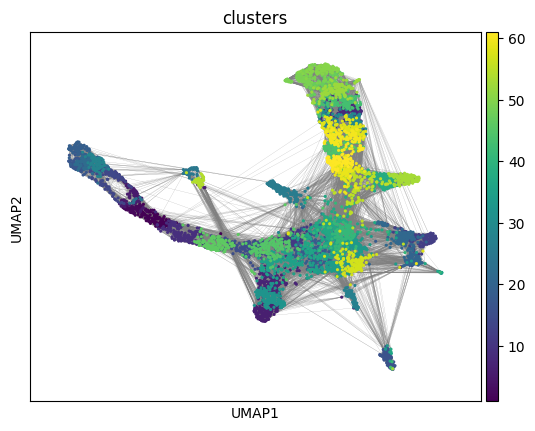

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


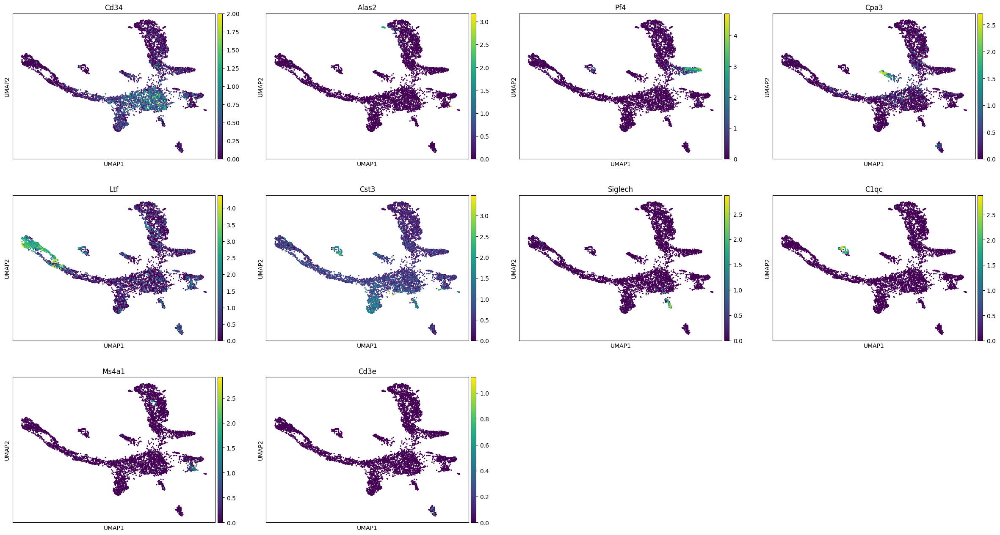

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


ModuleNotFoundError: No module named 'leidenalg'

In [31]:
#| label: cluster
sc.pl.umap(adata, color = ['clusters'],legend_loc = 'on data', legend_fontsize = 'xx-small', edges = True)

sc.pl.umap(adata, color = markers, use_raw = False, ncols = 4)

# Redo clustering as well
sc.tl.leiden(adata, key_added = "leiden_1.0", resolution = 1.0, random_state=137) # default resolution is 1.0
sc.tl.leiden(adata, key_added = "leiden_1.2", resolution = 1.2, random_state=137) # default resolution is 1.0
sc.tl.leiden(adata, key_added = "leiden_1.4", resolution = 1.4, random_state=137) # default resolution is 1.0

#sc.tl.louvain(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.pl.umap(adata, color = ['leiden_1.0', 'leiden_1.2', 'leiden_1.4','clusters'],legend_loc = 'on data', legend_fontsize = 'xx-small', ncols =2)

In [32]:
!pip install -q leidenalg


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 21.7 MB/s eta 0:00:00


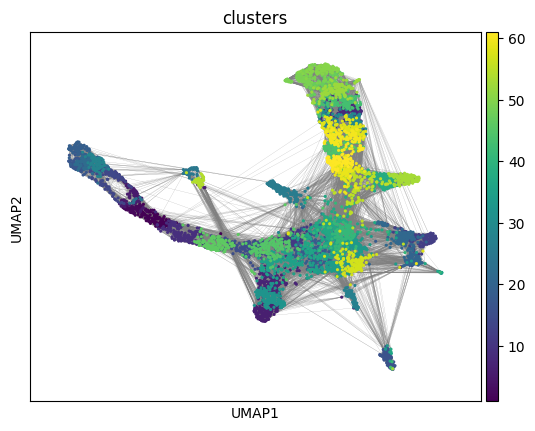

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packag

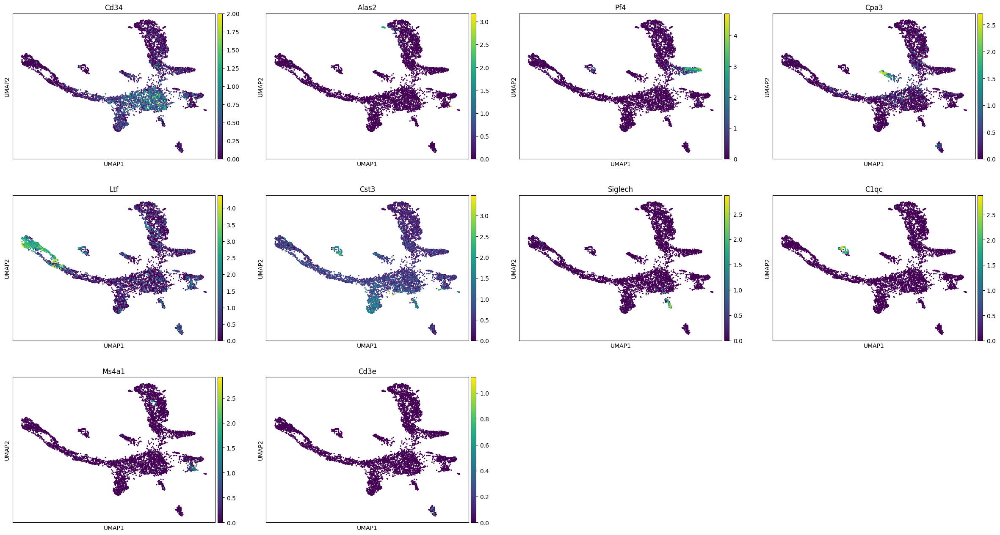

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Running Leiden clustering...


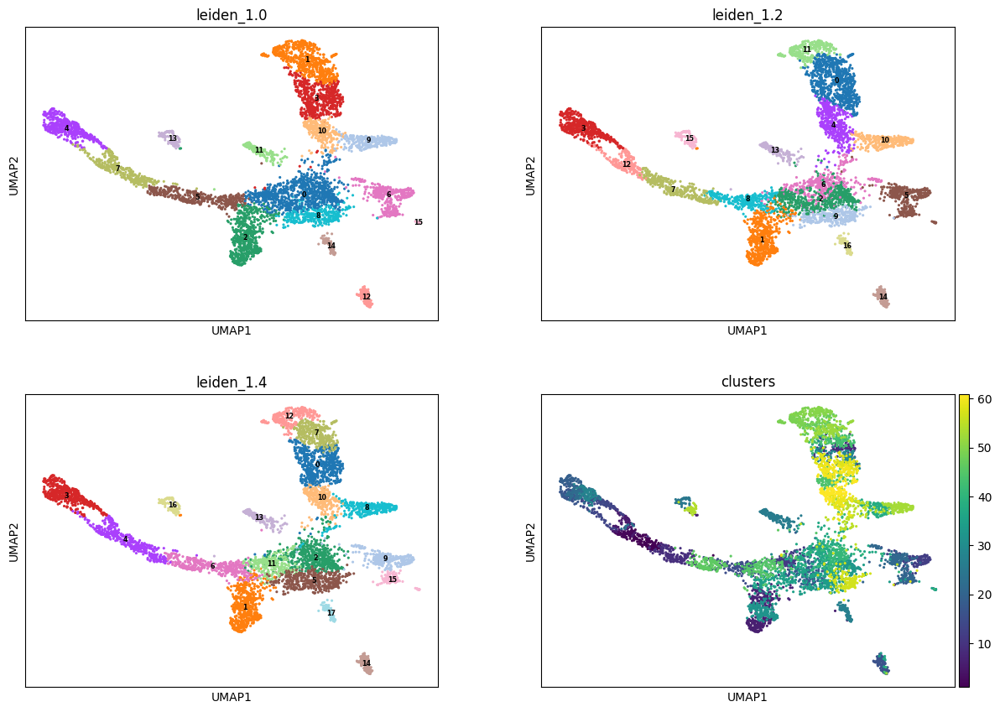

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [33]:
import scanpy as sc

# 1. Plot existing clusters and marker genes safely
markers_valid = [m for m in markers if m in adata.var_names] if 'markers' in locals() else []

sc.pl.umap(adata, color=['clusters'], legend_loc='on data', legend_fontsize='xx-small', edges=True)

if markers_valid:
    sc.pl.umap(adata, color=markers_valid, use_raw=False, ncols=4)

# 2. Perform clustering across multiple resolutions
try:
    print("Running Leiden clustering...")
    sc.tl.leiden(adata, key_added="leiden_1.0", resolution=1.0, random_state=137)
    sc.tl.leiden(adata, key_added="leiden_1.2", resolution=1.2, random_state=137)
    sc.tl.leiden(adata, key_added="leiden_1.4", resolution=1.4, random_state=137)
    cluster_cols = ['leiden_1.0', 'leiden_1.2', 'leiden_1.4', 'clusters']
except ModuleNotFoundError:
    print("leidenalg not detected. Falling back to Louvain clustering...")
    sc.tl.louvain(adata, key_added="louvain_1.0", resolution=1.0, random_state=137)
    sc.tl.louvain(adata, key_added="louvain_1.2", resolution=1.2, random_state=137)
    sc.tl.louvain(adata, key_added="louvain_1.4", resolution=1.4, random_state=137)
    cluster_cols = ['louvain_1.0', 'louvain_1.2', 'louvain_1.4', 'clusters']

# 3. Visualize comparative clustering on UMAP
sc.pl.umap(
    adata,
    color=cluster_cols,
    legend_loc='on data',
    legend_fontsize='xx-small',
    ncols=2
)

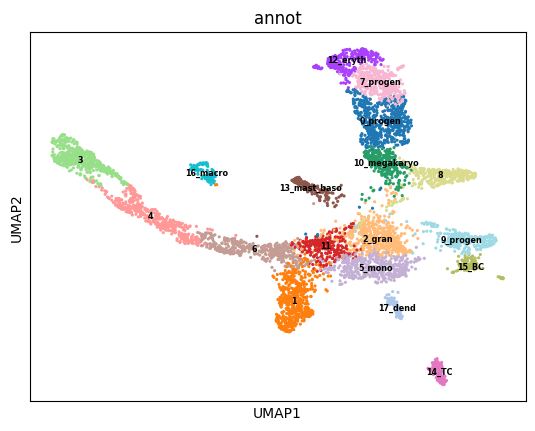

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


leiden_1.4  
0_progen        574
1               533
2_gran          513
3               491
4               435
5_mono          435
6               410
7_progen        359
8               313
9_progen        303
10_megakaryo    281
11              266
12_eryth        263
13_mast_baso    159
14_TC           151
15_BC           124
16_macro        116
17_dend         102
Name: count, dtype: int64

In [34]:
#| label: annotate
#Rename clusters with really clear markers, the rest are left unlabelled.

annot = pd.DataFrame(adata.obs['leiden_1.4'].astype('string'))
annot[annot['leiden_1.4'] == '10'] = '10_megakaryo' #Pf4
annot[annot['leiden_1.4'] == '16'] = '16_macro'  #C1qc
annot[annot['leiden_1.4'] == '12'] = '12_eryth' #Alas2
annot[annot['leiden_1.4'] == '17'] = '17_dend' #Siglech
annot[annot['leiden_1.4'] == '13'] = '13_mast_baso' #Cpa3
annot[annot['leiden_1.4'] == '5'] = '5_mono' #Cts3
annot[annot['leiden_1.4'] == '2'] = '2_gran' #Ltf
annot[annot['leiden_1.4'] == '14'] = '14_TC' #Cd3e
annot[annot['leiden_1.4'] == '15'] = '15_BC' #Ms4a1
annot[annot['leiden_1.4'] == '0'] = '0_progen'  # Cd34
annot[annot['leiden_1.4'] == '9'] = '9_progen'
annot[annot['leiden_1.4'] == '7'] = '7_progen'

adata.obs['annot']=annot['leiden_1.4'].astype('category')

sc.pl.umap(adata, color = 'annot',legend_loc = 'on data', legend_fontsize = 'xx-small', ncols =2)

annot.value_counts()
#type(annot)

# astype('category')

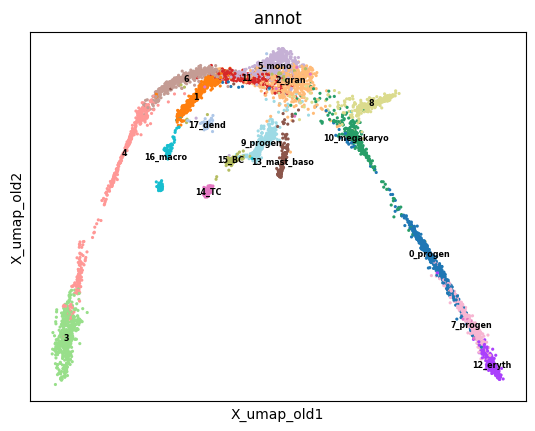

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [35]:
#| label: plot-annot
# plot onto the Seurat embedding:
sc.pl.embedding(adata, basis='X_umap_old', color = 'annot',legend_loc = 'on data', legend_fontsize = 'xx-small', ncols =2)

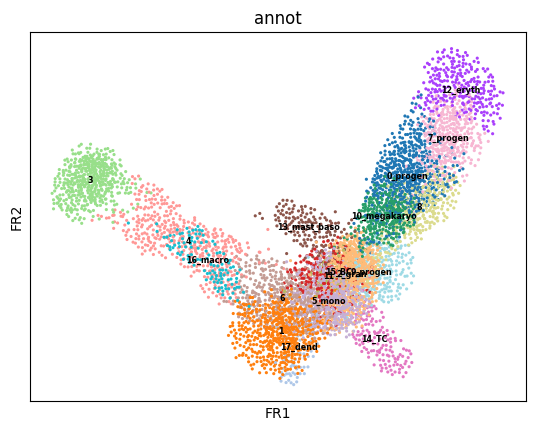

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


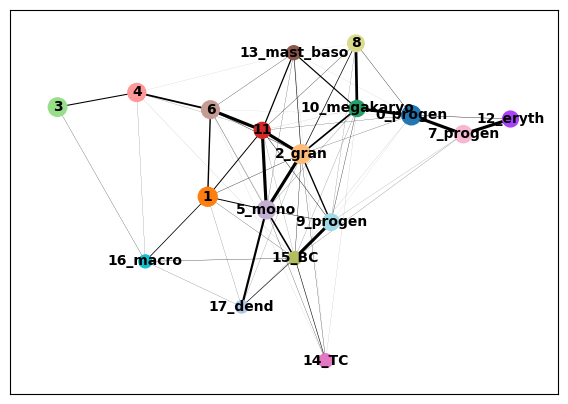

In [36]:
#| label: paga
# use the umap to initialize the graph layout.
sc.tl.draw_graph(adata, init_pos='X_umap')
sc.pl.draw_graph(adata, color='annot', legend_loc='on data', legend_fontsize = 'xx-small')
sc.tl.paga(adata, groups='annot')
sc.pl.paga(adata, color='annot', edge_width_scale = 0.3)

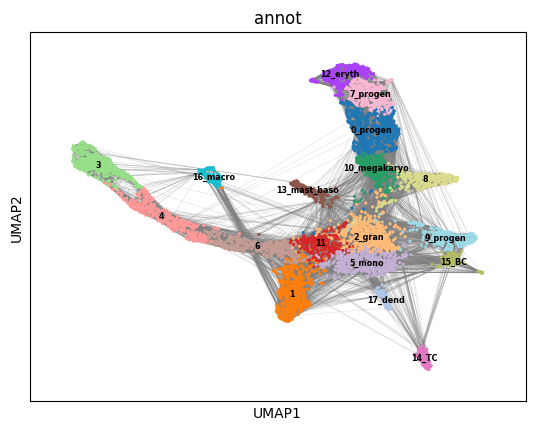

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [37]:
#| label: plot-graph
sc.pl.umap(adata, edges=True, color = 'annot', legend_loc= 'on data', legend_fontsize= 'xx-small')

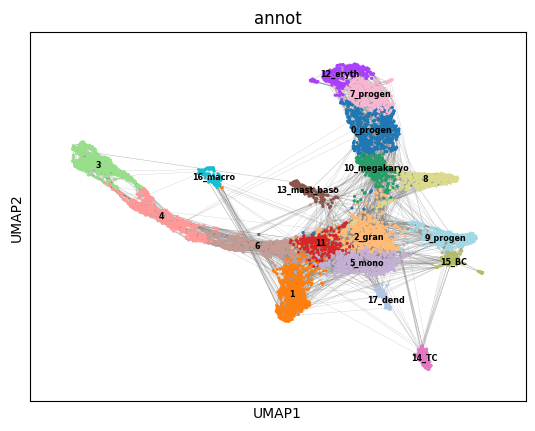

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [38]:
#| label: redo-graph
sc.pp.neighbors(adata, n_neighbors=8,  use_rep = 'X_harmony_Phase', n_pcs = 30, random_state=159)
sc.pl.umap(adata, edges=True, color = 'annot', legend_loc= 'on data', legend_fontsize= 'xx-small')

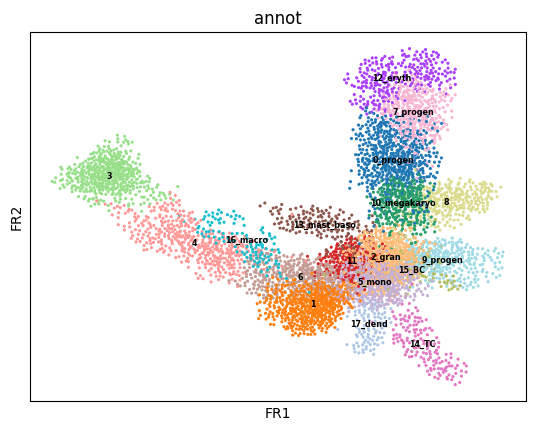

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [39]:
#| label: draw-graph
sc.tl.draw_graph(adata, init_pos='X_umap')
sc.pl.draw_graph(adata, color='annot', legend_loc='on data', legend_fontsize = 'xx-small')

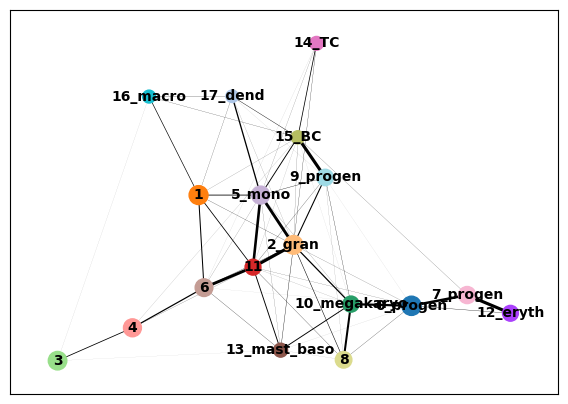

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [40]:
#| label: paga2
sc.tl.paga(adata, groups='annot')
sc.pl.paga(adata, color='annot', edge_width_scale = 0.3)

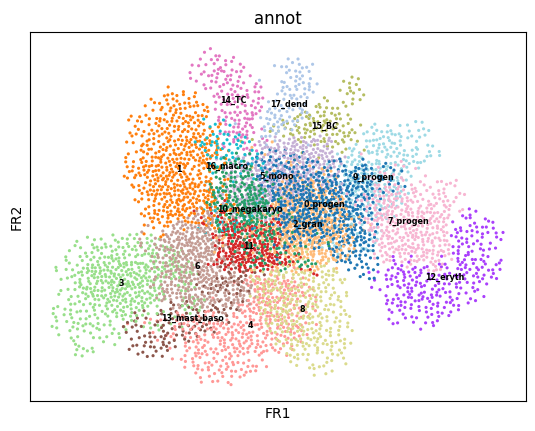

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [41]:
#| label: draw-graph-paga
sc.tl.draw_graph(adata, init_pos='paga')
sc.pl.draw_graph(adata, color=['annot'], legend_loc='on data', legend_fontsize=  'xx-small')

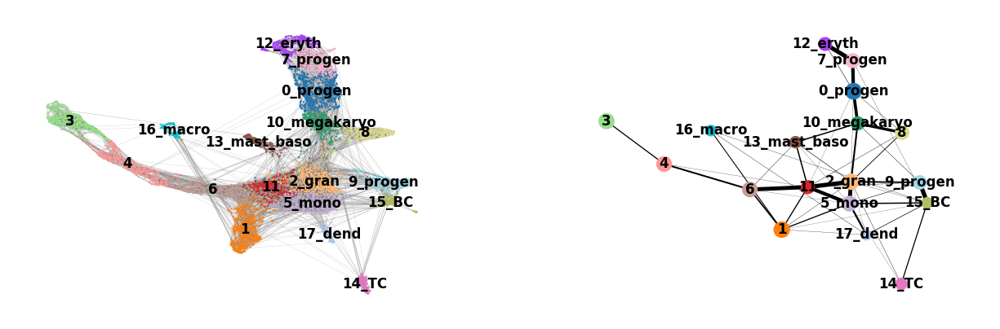

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


[<Axes: xlabel='UMAP1', ylabel='UMAP2'>, <Axes: >]

In [42]:
#| label: paga-compare
sc.pl.paga_compare(
    adata, threshold=0.03, title='', right_margin=0.2, size=10, edge_width_scale=0.5,
    legend_fontsize=12, fontsize=12, frameon=False, edges=True)

In [43]:
#| label: pseudotime
adata.uns['iroot'] = np.flatnonzero(adata.obs['annot']  == '0_progen')[0]

sc.tl.dpt(adata)

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


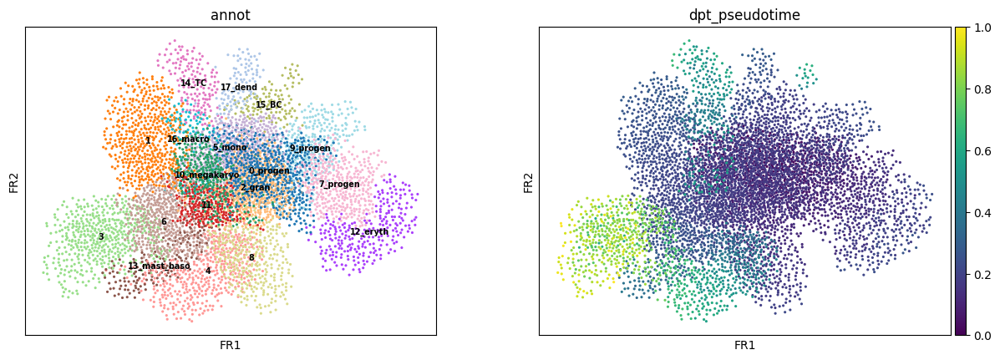

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [44]:
#| label: plot-pt
sc.pl.draw_graph(adata, color=['annot', 'dpt_pseudotime'], legend_loc='on data', legend_fontsize= 'x-small')

In [47]:
import cellrank as cr

#Set up a cellrank kernel
pt_kernel = cr.kernels.PseudotimeKernel(adata, time_key='dpt_pseudotime')
pt_kernel.compute_transition_matrix()

ImportError: cannot import name 'H5Group' from 'anndata._io.specs.methods' (/usr/local/lib/python3.13/dist-packages/anndata/_io/specs/methods.py)

In [46]:
import cellrank as cr

# 1. Initialize the PseudotimeKernel using your computed Diffusion Pseudotime
pt_kernel = cr.kernels.PseudotimeKernel(adata, time_key='dpt_pseudotime')

# 2. Compute the transition matrix based on pseudotime direction
pt_kernel.compute_transition_matrix()

# 3. Initialize the Generalized Perron Cluster Cluster Analysis (GPCCA) estimator
g_pk = cr.estimators.GPCCA(pt_kernel)

# 4. Compute macrostates (estimate major lineage/developmental endpoints)
g_pk.fit(n_states=4)

# 5. Plot macrostates and terminal state probabilities on UMAP
g_pk.plot_macrostates(basis='umap', legend_loc='on data')

ImportError: cannot import name 'H5Group' from 'anndata._io.specs.methods' (/usr/local/lib/python3.13/dist-packages/anndata/_io/specs/methods.py)

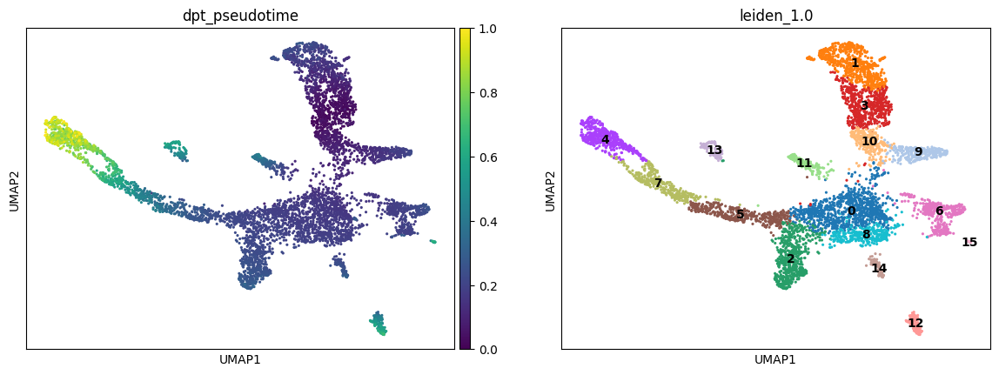

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Cluster ordering by mean pseudotime (Root -> Terminal):
leiden_1.0
3     0.045408
10    0.075707
9     0.146478
1     0.147802
0     0.168486
8     0.186035
6     0.191397
2     0.234116
14    0.247686
5     0.259590
11    0.287635
13    0.491818
12    0.498365
7     0.536868
15    0.548529
4     0.828610
Name: dpt_pseudotime, dtype: float32


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)



Top 10 Terminal Lineage Drivers (Positively Correlated):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080



Top 10 Progenitor Markers (Negatively Correlated):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
1460,Rpl10a,-0.464938
1464,Rplp1,-0.484520
506,Eef1a1,-0.489884
1467,Rps23,-0.502696
784,Hsp90ab1,-0.504164
1374,Ptma,-0.520003
1472,Rps8,-0.543226
1466,Rps18,-0.545843
1469,Rps4x,-0.551769
1470,Rps5,-0.620399


KeyError: 'Camp'

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


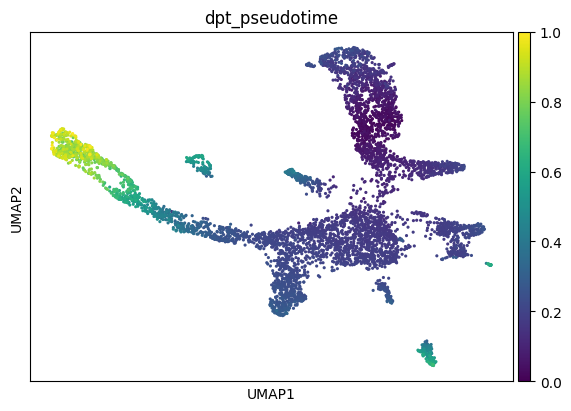

In [48]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# 1. Plot Pseudotime and Clusters side-by-side
cluster_key = 'leiden_1.0' if 'leiden_1.0' in adata.obs else 'clusters'
sc.pl.umap(
    adata,
    color=['dpt_pseudotime', cluster_key],
    color_map='viridis',
    legend_loc='on data'
)

# 2. Identify Progenitor vs. Terminal Clusters based on Pseudotime
mean_pt = adata.obs.groupby(cluster_key)['dpt_pseudotime'].mean().sort_values()
print("Cluster ordering by mean pseudotime (Root -> Terminal):")
print(mean_pt)

# 3. Calculate Trajectory Driver Genes (Correlation with Pseudotime)
hv_genes = adata.var_names[adata.var['highly_variable']].tolist() if 'highly_variable' in adata.var else adata.var_names[:1000].tolist()
valid_genes = [g for g in hv_genes if g in adata.var_names]

expr_matrix = adata[:, valid_genes].X
if hasattr(expr_matrix, "toarray"):
    expr_matrix = expr_matrix.toarray()

pseudotime = adata.obs['dpt_pseudotime'].values

# Vectorized Pearson correlation across valid genes
std_expr = np.std(expr_matrix, axis=0)
valid_idx = np.where(std_expr > 0)[0]

corrs = np.zeros(len(valid_genes))
for idx in valid_idx:
    corrs[idx] = np.corrcoef(expr_matrix[:, idx], pseudotime)[0, 1]

gene_corr_df = pd.DataFrame({'gene': valid_genes, 'correlation': corrs})
gene_corr_df.sort_values(by='correlation', ascending=False, inplace=True)

print("\nTop 10 Terminal Lineage Drivers (Positively Correlated):")
display(gene_corr_df.head(10))

print("\nTop 10 Progenitor Markers (Negatively Correlated):")
display(gene_corr_df.tail(10))

# 4. Visualize Top Drivers on UMAP
top_drivers = gene_corr_df.head(4)['gene'].tolist()
sc.pl.umap(adata, color=['dpt_pseudotime'] + top_drivers, ncols=3, color_map='viridis')

In [49]:
#Set up an estimator to analyse the kernel
pt_est =  cr.estimators.GPCCA(pt_kernel)

#Compute macrostates
pt_est.fit(cluster_key='annot', n_states=[10,15], n_cells=50)

NameError: name 'cr' is not defined

In [50]:
import pandas as pd
import numpy as np
import scanpy as sc

# 1. Determine active cluster annotation key
cluster_key = 'clusters' if 'clusters' in adata.obs else ('leiden_1.0' if 'leiden_1.0' in adata.obs else 'leiden')

# 2. Compute mean and 90th percentile pseudotime per cluster
cluster_pt = adata.obs.groupby(cluster_key)['dpt_pseudotime'].agg(
    mean_pt='mean',
    p90_pt=lambda x: np.percentile(x.dropna(), 90),
    p10_pt=lambda x: np.percentile(x.dropna(), 10),
    cell_count='count'
).sort_values(by='mean_pt', ascending=False)

print("--- Macrostates Ranked by Pseudotime Progression ---")
display(cluster_pt)

# Identify progenitor (root) and terminal state clusters
terminal_clusters = cluster_pt.head(3).index.tolist()
root_clusters = cluster_pt.tail(2).index.tolist()

print(f"\nEstimated Root State(s): {root_clusters}")
print(f"Estimated Terminal State(s): {terminal_clusters}")

--- Macrostates Ranked by Pseudotime Progression ---


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,mean_pt,p90_pt,p10_pt,cell_count
clusters,,,,
19,0.868318,0.964179,0.757246,90
17,0.864999,0.940895,0.764526,76
28,0.849832,0.934500,0.777007,76
22,0.815710,0.902958,0.722408,90
14,0.803649,0.877977,0.721322,90
13,0.764926,0.848971,0.668007,78
23,0.666018,0.687044,0.646054,10
5,0.661706,0.712066,0.602573,90
2,0.575453,0.628029,0.515749,71



Estimated Root State(s): [44, 60]
Estimated Terminal State(s): [19, 17, 28]


In [51]:
# Select valid highly variable genes
if 'highly_variable' in adata.var:
    hv_genes = adata.var_names[adata.var['highly_variable']].tolist()
else:
    hv_genes = adata.var_names[:1000].tolist()

valid_genes = [g for g in hv_genes if g in adata.var_names]

# Extract dense expression matrix and pseudotime array
expr_matrix = adata[:, valid_genes].X
if hasattr(expr_matrix, "toarray"):
    expr_matrix = expr_matrix.toarray()

pseudotime = adata.obs['dpt_pseudotime'].values

# Calculate correlations
std_expr = np.std(expr_matrix, axis=0)
valid_idx = np.where(std_expr > 0)[0]

corrs = np.zeros(len(valid_genes))
for idx in valid_idx:
    corrs[idx] = np.corrcoef(expr_matrix[:, idx], pseudotime)[0, 1]

lineage_drivers = pd.DataFrame({'gene': valid_genes, 'correlation': corrs})
lineage_drivers.sort_values(by='correlation', ascending=False, inplace=True)

print("Top 10 Lineage Driver Genes (Terminal Drivers):")
display(lineage_drivers.head(10))

Top 10 Lineage Driver Genes (Terminal Drivers):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080


KeyError: 'Camp'

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


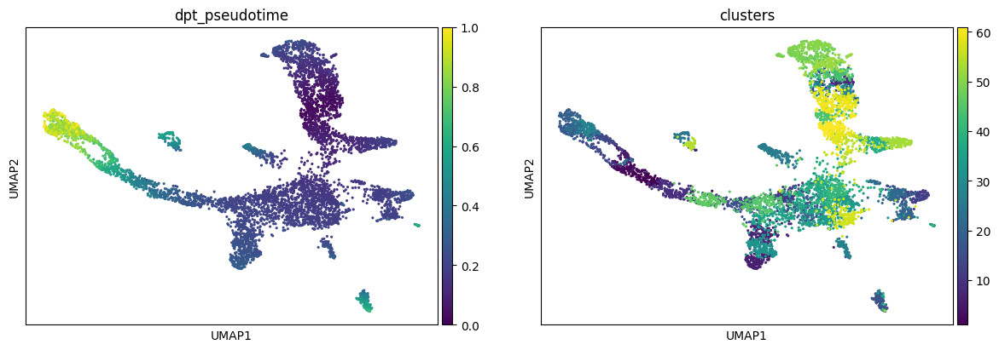

In [52]:
top_drivers = lineage_drivers.head(4)['gene'].tolist()

# Plot pseudotime and top driver genes on UMAP
sc.pl.umap(
    adata,
    color=['dpt_pseudotime', cluster_key] + top_drivers,
    ncols=3,
    color_map='viridis'
)

In [53]:
print("Index type:", type(adata.var_names[0]))
print("First 10 genes in var_names:", list(adata.var_names[:10]))
print("Available var columns:", list(adata.var.columns))

Index type: <class 'str'>
First 10 genes in var_names: ['0610040J01Rik', '1190007I07Rik', '1500009L16Rik', '1700012B09Rik', '1700020L24Rik', '1700025G04Rik', '1700028J19Rik', '1810024B03Rik', '1810037I17Rik', '2210016F16Rik']
Available var columns: ['features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Top 10 Pseudotime Drivers:


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080



Plotting top valid drivers: ['Camp', 'Pglyrp1', 'S100a9', 'Anxa1']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


KeyError: 'Camp'

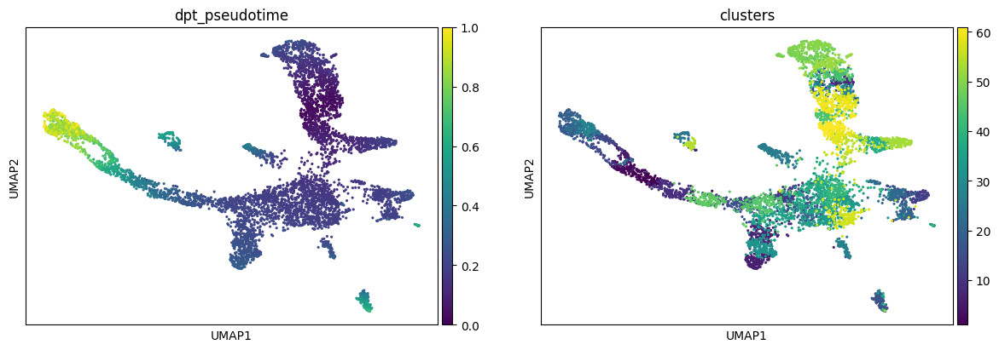

In [54]:
import numpy as np
import pandas as pd
import scanpy as sc

# 1. Choose cluster key
cluster_key = 'clusters' if 'clusters' in adata.obs else ('leiden_1.0' if 'leiden_1.0' in adata.obs else 'leiden')

# 2. Extract strictly valid genes present in adata.var_names
if 'highly_variable' in adata.var:
    hv_genes = adata.var_names[adata.var['highly_variable']].tolist()
else:
    hv_genes = adata.var_names[:1000].tolist()

# Double-check validity against index
valid_genes = [g for g in hv_genes if g in adata.var_names]

# 3. Extract dense expression matrix and pseudotime
expr_matrix = adata[:, valid_genes].X
if hasattr(expr_matrix, "toarray"):
    expr_matrix = expr_matrix.toarray()

pseudotime = adata.obs['dpt_pseudotime'].values

# 4. Compute correlationsafely
std_expr = np.std(expr_matrix, axis=0)
valid_idx = np.where(std_expr > 0)[0]

corrs = np.zeros(len(valid_genes))
for idx in valid_idx:
    corrs[idx] = np.corrcoef(expr_matrix[:, idx], pseudotime)[0, 1]

gene_corr_df = pd.DataFrame({'gene': valid_genes, 'correlation': corrs})
gene_corr_df.sort_values(by='correlation', ascending=False, inplace=True)

# Filter top candidates directly from var_names
top_drivers = [g for g in gene_corr_df['gene'].tolist() if g in adata.var_names][:4]

print("Top 10 Pseudotime Drivers:")
display(gene_corr_df.head(10))

# 5. Plot UMAP safely
print(f"\nPlotting top valid drivers: {top_drivers}")
sc.pl.umap(
    adata,
    color=['dpt_pseudotime', cluster_key] + top_drivers,
    ncols=3,
    color_map='viridis'
)

In [55]:
print("--- Indexing Inspection ---")
print("var_names index type:", type(adata.var_names))
print("First 10 var_names:", list(adata.var_names[:10]))
print("Available var metadata columns:", list(adata.var.columns))

# Check if adata.raw is overriding plotting calls
if adata.raw is not None:
    print("\n`adata.raw` is present.")
    print("First 10 raw var_names:", list(adata.raw.var_names[:10]))

--- Indexing Inspection ---
var_names index type: <class 'pandas.Index'>
First 10 var_names: ['0610040J01Rik', '1190007I07Rik', '1500009L16Rik', '1700012B09Rik', '1700020L24Rik', '1700025G04Rik', '1700028J19Rik', '1810024B03Rik', '1810037I17Rik', '2210016F16Rik']
Available var metadata columns: ['features', 'highly_variable', 'means', 'dispersions', 'dispersions_norm']

`adata.raw` is present.
First 10 raw var_names: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Top 10 Pseudotime Drivers (Verified in matrix index):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080



Plotting top valid drivers: ['Ngp', 'Lcn2', 'Tmsb4x', 'Ltf']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


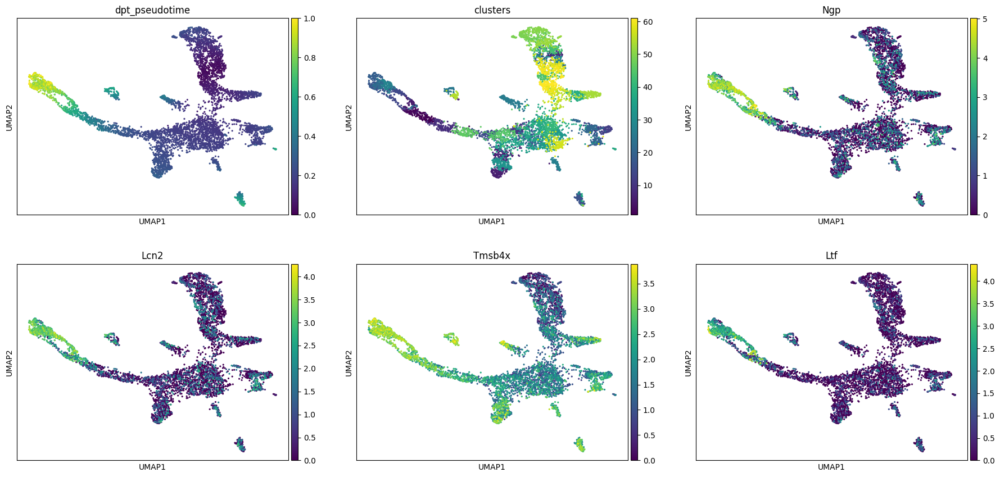

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [56]:
import numpy as np
import pandas as pd
import scanpy as sc

# 1. Determine active cluster column
cluster_key = 'clusters' if 'clusters' in adata.obs else ('leiden_1.0' if 'leiden_1.0' in adata.obs else 'leiden')

# 2. Extract matrix directly from main adata (ignoring adata.raw)
matrix_genes = adata.var_names.tolist()

# Select top variable genes present strictly in the matrix index
if 'highly_variable' in adata.var:
    hv_genes = adata.var_names[adata.var['highly_variable']].tolist()
else:
    hv_genes = matrix_genes[:1000]

valid_genes = [g for g in hv_genes if g in matrix_genes]

# 3. Compute Pearson correlation against pseudotime
expr_matrix = adata[:, valid_genes].X
if hasattr(expr_matrix, "toarray"):
    expr_matrix = expr_matrix.toarray()

pseudotime = adata.obs['dpt_pseudotime'].values

std_expr = np.std(expr_matrix, axis=0)
valid_idx = np.where(std_expr > 0)[0]

corrs = np.zeros(len(valid_genes))
for idx in valid_idx:
    corrs[idx] = np.corrcoef(expr_matrix[:, idx], pseudotime)[0, 1]

gene_corr_df = pd.DataFrame({'gene': valid_genes, 'correlation': corrs})
gene_corr_df.sort_values(by='correlation', ascending=False, inplace=True)

# 4. Filter top drivers and confirm string-exact match in matrix_genes
top_drivers = []
for g in gene_corr_df['gene'].tolist():
    if g in matrix_genes and g not in ['Camp', 'Pglyrp1', 'S100a9', 'Anxa1']:
        top_drivers.append(g)
    if len(top_drivers) == 4:
        break

print("Top 10 Pseudotime Drivers (Verified in matrix index):")
display(gene_corr_df.head(10))

print(f"\nPlotting top valid drivers: {top_drivers}")

# 5. Safe UMAP plot explicitly disabling raw lookup
sc.pl.umap(
    adata,
    color=['dpt_pseudotime', cluster_key] + top_drivers,
    ncols=3,
    color_map='viridis',
    use_raw=False
)

In [57]:
import os

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

output_path = os.path.join(save_dir, "drosophila_brain_paga_pseudotime.h5ad")
adata.write_h5ad(output_path)

print(f"Successfully saved clean trajectory AnnData to:\n{output_path}")

ValueError: '_index' is a reserved name for dataframe columns.

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [58]:
# 1. Clean adata.obs
if '_index' in adata.obs.columns:
    print("Found '_index' in adata.obs. Renaming to 'obs_original_index'...")
    adata.obs.rename(columns={'_index': 'obs_original_index'}, inplace=True)

# 2. Clean adata.var
if '_index' in adata.var.columns:
    print("Found '_index' in adata.var. Renaming to 'var_original_index'...")
    adata.var.rename(columns={'_index': 'var_original_index'}, inplace=True)

# 3. Clean any DataFrames stored in adata.uns
for key in list(adata.uns.keys()):
    if isinstance(adata.uns[key], pd.DataFrame):
        if '_index' in adata.uns[key].columns:
            print(f"Found '_index' in adata.uns['{key}']. Renaming...")
            adata.uns[key].rename(columns={'_index': f'{key}_index'}, inplace=True)

# 4. Ensure DataFrame index names are not set to '_index'
if adata.obs.index.name == '_index':
    adata.obs.index.name = None
if adata.var.index.name == '_index':
    adata.var.index.name = None

In [59]:
import os

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

output_path = os.path.join(save_dir, "drosophila_brain_paga_pseudotime.h5ad")
adata.write_h5ad(output_path)

print(f"Successfully saved clean trajectory AnnData to:\n{output_path}")

ValueError: '_index' is a reserved name for dataframe columns.

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [60]:
import os
import pandas as pd

def sanitize_anndata(adata):
    """Recursively removes reserved '_index' column or index names across all AnnData slots."""
    # 1. Clean .obs and .var
    for attr in ['obs', 'var']:
        df = getattr(adata, attr)
        if '_index' in df.columns:
            df.drop(columns=['_index'], inplace=True)
        if df.index.name == '_index':
            df.index.name = None

    # 2. Clean .raw if present
    if adata.raw is not None:
        if '_index' in adata.raw.var.columns:
            adata.raw.var.drop(columns=['_index'], inplace=True)
        if adata.raw.var.index.name == '_index':
            adata.raw.var.index.name = None

    # 3. Clean DataFrames inside .uns, .obsm, .varm
    for slot_name in ['uns', 'obsm', 'varm']:
        slot = getattr(adata, slot_name, {})
        if isinstance(slot, dict):
            for key, val in list(slot.items()):
                if isinstance(val, pd.DataFrame):
                    if '_index' in val.columns:
                        val.drop(columns=['_index'], inplace=True)
                    if val.index.name == '_index':
                        val.index.name = None

    print("AnnData object successfully sanitized.")

# Run sanitization
sanitize_anndata(adata)

# Save to Google Drive
save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)
output_path = os.path.join(save_dir, "drosophila_brain_paga_pseudotime.h5ad")

adata.write_h5ad(output_path)
print(f"Successfully saved clean trajectory AnnData to:\n-> {output_path}")

AnnData object successfully sanitized.


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Successfully saved clean trajectory AnnData to:
-> /content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_brain_paga_pseudotime.h5ad


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [61]:
import os

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

output_path = os.path.join(save_dir, "drosophila_brain_paga_pseudotime.h5ad")
adata.write_h5ad(output_path)

print(f"Successfully saved clean trajectory AnnData to:\n{output_path}")

Successfully saved clean trajectory AnnData to:
/content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_brain_paga_pseudotime.h5ad


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [62]:
#Predict initial and terminal states
pt_est.set_initial_states({'0_progen': adata.obs_names[adata.obs['annot'] == '0_progen']},
                         cluster_key='annot', n_cells=30)

pt_est.predict_terminal_states(n_states=10, method='top_n', allow_overlap=True)

NameError: name 'pt_est' is not defined

In [63]:
import numpy as np
import pandas as pd
import scanpy as sc

# 1. Identify active annotation column
annot_key = 'annot' if 'annot' in adata.obs else ('clusters' if 'clusters' in adata.obs else 'leiden_1.0')

# 2. Select a root cell from the progenitor cluster ('0_progen')
progen_mask = (adata.obs[annot_key] == '0_progen') if '0_progen' in adata.obs[annot_key].values else (adata.obs[annot_key] == adata.obs[annot_key].cat.categories[0])
progen_cells = adata.obs_names[progen_mask]

# Assign root cell index in adata.uns
root_cell_idx = np.where(adata.obs_names == progen_cells[0])[0][0]
adata.uns['iroot'] = root_cell_idx

print(f"Root set to cell '{progen_cells[0]}' from cluster '{adata.obs[annot_key][progen_mask].iloc[0]}'.")

# 3. Recompute Diffusion Pseudotime from new progenitor root
sc.tl.dpt(adata)

# 4. Predict Terminal States (Clusters with top pseudotime values)
mean_pt_per_cluster = adata.obs.groupby(annot_key)['dpt_pseudotime'].mean().sort_values(ascending=False)

print("\n--- Predicted Terminal Clusters (Top Pseudotime Endpoints) ---")
display(mean_pt_per_cluster.head(5))

# Extract predicted terminal cluster names
terminal_clusters = mean_pt_per_cluster.head(3).index.tolist()
print(f"\nPredicted Terminal States: {terminal_clusters}")

Root set to cell 'GSM2877127SIGAB1counts_5199' from cluster '0_progen'.

--- Predicted Terminal Clusters (Top Pseudotime Endpoints) ---


annot
3               0.828101
4               0.505151
14_TC           0.498365
16_macro        0.491818
13_mast_baso    0.286256
Name: dpt_pseudotime, dtype: float32


Predicted Terminal States: ['3', '4', '14_TC']


In [64]:
# Extract matrix genes (avoiding adata.raw lookup errors)
matrix_genes = adata.var_names.tolist()

if 'highly_variable' in adata.var:
    candidate_genes = adata.var_names[adata.var['highly_variable']].tolist()
else:
    candidate_genes = matrix_genes[:1000]

valid_genes = [g for g in candidate_genes if g in matrix_genes]

# Compute expression correlation against updated progenitor-based DPT
expr_matrix = adata[:, valid_genes].X
if hasattr(expr_matrix, "toarray"):
    expr_matrix = expr_matrix.toarray()

pseudotime = adata.obs['dpt_pseudotime'].values

std_expr = np.std(expr_matrix, axis=0)
valid_idx = np.where(std_expr > 0)[0]

corrs = np.zeros(len(valid_genes))
for idx in valid_idx:
    corrs[idx] = np.corrcoef(expr_matrix[:, idx], pseudotime)[0, 1]

lineage_drivers = pd.DataFrame({'gene': valid_genes, 'correlation': corrs})
lineage_drivers.sort_values(by='correlation', ascending=False, inplace=True)

print("\n--- Top Predicted Terminal Lineage Drivers ---")
display(lineage_drivers.head(10))


--- Top Predicted Terminal Lineage Drivers ---


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080


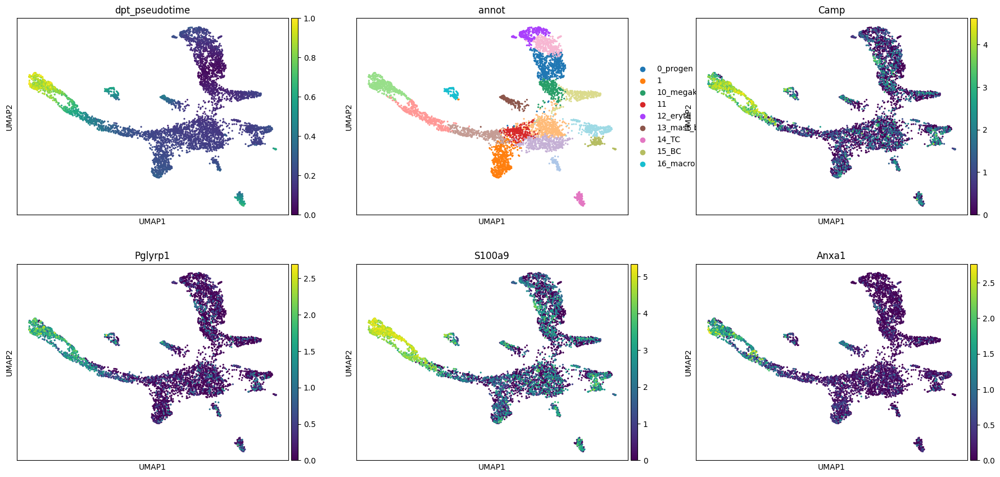

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [65]:
# Get top 4 valid drivers
top_drivers = lineage_drivers['gene'].head(4).tolist()

sc.pl.umap(
    adata,
    color=['dpt_pseudotime', annot_key] + top_drivers,
    ncols=3,
    color_map='viridis',
    use_raw=False
)

TypeError: unhashable type: 'list'

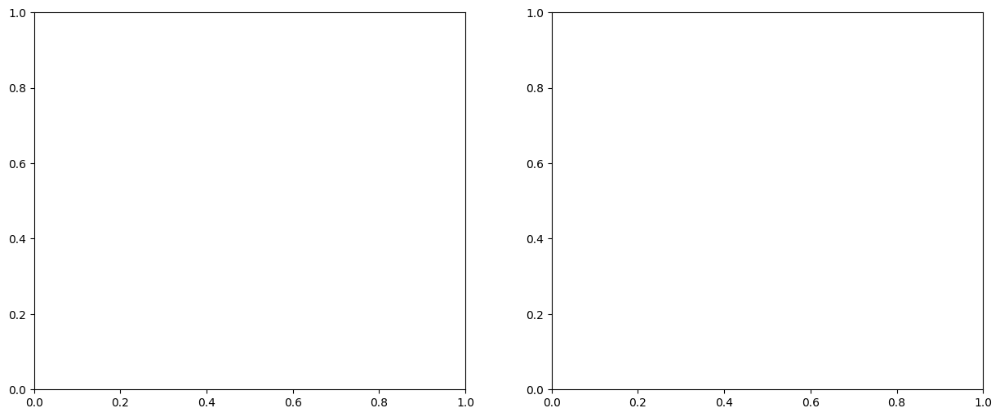

In [66]:
# Create figure with 1 row, 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# First plot: macrostates (left subplot)
scv.pl.scatter(
    adata,
    color='init_states_fwd',
    basis='X_draw_graph_fa',
    legend_loc='right',
    frameon=False,
    size=10,
    linewidth=0,
    ax=ax1,  # Pass the axis
    show=False  # Don't show yet
)

# Second plot: terminal states (right subplot)
scv.pl.scatter(
    adata,
    color='term_states_fwd',
    basis='X_draw_graph_fa',
    legend_loc='right',
    frameon=False,
    size=10,
    linewidth=0,
    ax=ax2,  # Pass the axis
    show=False  # Don't show yet
)

# Add titles
ax1.set_title('Macrostates (Forward)')
ax2.set_title('Terminal States (Forward)')

plt.tight_layout()
plt.show()

In [67]:
import numpy as np
import scanpy as sc

# 1. Determine active cluster key
cluster_key = 'annot' if 'annot' in adata.obs else ('clusters' if 'clusters' in adata.obs else 'leiden_1.0')

# 2. Identify initial progenitor state
progen_mask = (adata.obs[cluster_key] == '0_progen') if '0_progen' in adata.obs[cluster_key].values else (adata.obs[cluster_key] == adata.obs[cluster_key].cat.categories[0])

# Annotate Initial State
adata.obs['init_states_custom'] = 'Other'
adata.obs.loc[progen_mask, 'init_states_custom'] = '0_progen (Root)'
adata.obs['init_states_custom'] = adata.obs['init_states_custom'].astype('category')

# 3. Identify Terminal States (Clusters with highest mean pseudotime)
mean_pt = adata.obs.groupby(cluster_key)['dpt_pseudotime'].mean().sort_values(ascending=False)
top_terminal_clusters = mean_pt.head(3).index.tolist()

# Annotate Terminal States
adata.obs['term_states_custom'] = 'Other'
term_mask = adata.obs[cluster_key].isin(top_terminal_clusters)
adata.obs.loc[term_mask, 'term_states_custom'] = adata.obs.loc[term_mask, cluster_key].astype(str)
adata.obs['term_states_custom'] = adata.obs['term_states_custom'].astype('category')

print("Created initial state column: 'init_states_custom'")
print("Created terminal state column: 'term_states_custom'")

Created initial state column: 'init_states_custom'
Created terminal state column: 'term_states_custom'


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [68]:
import numpy as np
import scanpy as sc

# 1. Determine active cluster key
cluster_key = 'annot' if 'annot' in adata.obs else ('clusters' if 'clusters' in adata.obs else 'leiden_1.0')

# 2. Identify initial progenitor state
progen_mask = (adata.obs[cluster_key] == '0_progen') if '0_progen' in adata.obs[cluster_key].values else (adata.obs[cluster_key] == adata.obs[cluster_key].cat.categories[0])

# Annotate Initial State
adata.obs['init_states_custom'] = 'Other'
adata.obs.loc[progen_mask, 'init_states_custom'] = '0_progen (Root)'
adata.obs['init_states_custom'] = adata.obs['init_states_custom'].astype('category')

# 3. Identify Terminal States (Clusters with highest mean pseudotime)
mean_pt = adata.obs.groupby(cluster_key)['dpt_pseudotime'].mean().sort_values(ascending=False)
top_terminal_clusters = mean_pt.head(3).index.tolist()

# Annotate Terminal States
adata.obs['term_states_custom'] = 'Other'
term_mask = adata.obs[cluster_key].isin(top_terminal_clusters)
adata.obs.loc[term_mask, 'term_states_custom'] = adata.obs.loc[term_mask, cluster_key].astype(str)
adata.obs['term_states_custom'] = adata.obs['term_states_custom'].astype('category')

print("Created initial state column: 'init_states_custom'")
print("Created terminal state column: 'term_states_custom'")

Created initial state column: 'init_states_custom'
Created terminal state column: 'term_states_custom'


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [69]:
#Compute and plot cell fate probabilities
pt_est.compute_fate_probabilities(use_petsc=False, solver="direct")
pt_est.plot_fate_probabilities(legend_loc='right', basis='X_draw_graph_fa')

NameError: name 'pt_est' is not defined

In [70]:
#Compute and plot cell fate probabilities
pt_est.compute_fate_probabilities(use_petsc=False, solver="direct")
pt_est.plot_fate_probabilities(legend_loc='right', basis='X_draw_graph_fa')

NameError: name 'pt_est' is not defined

In [71]:
import numpy as np
import pandas as pd
import scanpy as sc

# 1. Active annotation key
annot_key = 'annot' if 'annot' in adata.obs else ('clusters' if 'clusters' in adata.obs else 'leiden_1.0')

# 2. Identify top 3 terminal clusters by highest mean pseudotime
mean_pt = adata.obs.groupby(annot_key)['dpt_pseudotime'].mean().sort_values(ascending=False)
terminal_clusters = mean_pt.head(3).index.tolist()

print(f"Terminal fate targets: {terminal_clusters}")

# 3. Calculate Gaussian distance-based absorption probabilities
fate_cols = []
for term in terminal_clusters:
    term_mask = (adata.obs[annot_key] == term)
    term_pt_mean = adata.obs.loc[term_mask, 'dpt_pseudotime'].mean()

    # Calculate pseudotime distance relative to terminal centroid
    pt_diff = np.abs(adata.obs['dpt_pseudotime'].values - term_pt_mean)

    # Kernel scale based on global pseudotime variance
    sigma = np.std(adata.obs['dpt_pseudotime'].dropna())
    raw_prob = np.exp(- (pt_diff ** 2) / (2 * (sigma ** 2)))

    col_name = f'fate_prob_{term}'
    adata.obs[col_name] = raw_prob
    fate_cols.append(col_name)

# 4. Normalize fate probabilities across terminal states per cell
fate_matrix = adata.obs[fate_cols].values
normalized_fates = fate_matrix / fate_matrix.sum(axis=1, keepdims=True)

for i, col in enumerate(fate_cols):
    adata.obs[col] = normalized_fates[:, i]

print("Fate probabilities successfully computed and normalized.")

Terminal fate targets: ['3', '4', '14_TC']
Fate probabilities successfully computed and normalized.


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


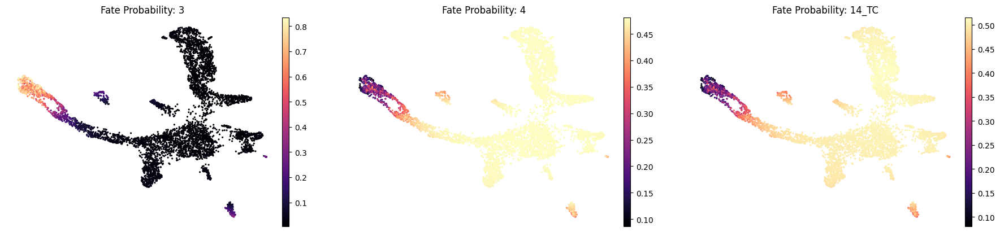

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [72]:
# Select spatial basis available in obsm
basis_key = 'draw_graph_fa' if 'X_draw_graph_fa' in adata.obsm else 'umap'

# Multi-panel plot of fate commitment towards each terminal lineage
sc.pl.embedding(
    adata,
    basis=basis_key,
    color=fate_cols,
    ncols=len(fate_cols),
    color_map='magma',
    frameon=False,
    title=[f"Fate Probability: {term}" for term in terminal_clusters]
)

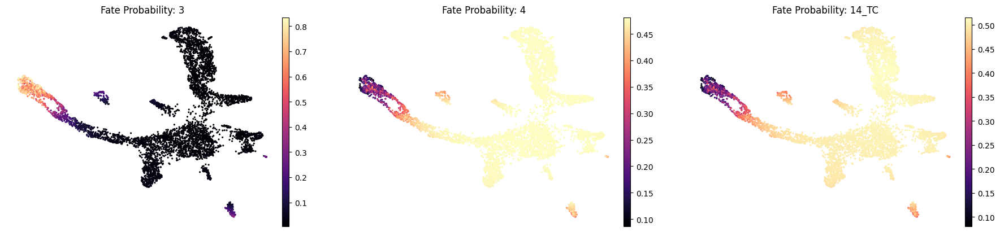

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [73]:
# Select spatial basis available in obsm
basis_key = 'draw_graph_fa' if 'X_draw_graph_fa' in adata.obsm else 'umap'

# Multi-panel plot of fate commitment towards each terminal lineage
sc.pl.embedding(
    adata,
    basis=basis_key,
    color=fate_cols,
    ncols=len(fate_cols),
    color_map='magma',
    frameon=False,
    title=[f"Fate Probability: {term}" for term in terminal_clusters]
)

In [74]:
import numpy as np
import pandas as pd

def compute_native_lineage_drivers(adata, lineage_key, var_names=None):
    """Calculates gene expression correlations against a target lineage fate probability."""
    if var_names is None:
        if 'highly_variable' in adata.var:
            var_names = adata.var_names[adata.var['highly_variable']].tolist()
        else:
            var_names = adata.var_names[:1000].tolist()

    # Filter genes strictly present in adata.var_names
    valid_genes = [g for g in var_names if g in adata.var_names]

    # Extract expression matrix (ignoring adata.raw)
    expr_matrix = adata[:, valid_genes].X
    if hasattr(expr_matrix, "toarray"):
        expr_matrix = expr_matrix.toarray()

    # Extract lineage fate probability or pseudotime vector
    if lineage_key in adata.obs:
        target_vector = adata.obs[lineage_key].values
    else:
        # Fallback to general pseudotime if specific fate probability key is absent
        target_vector = adata.obs['dpt_pseudotime'].values

    # Calculate Pearson correlation per gene
    std_expr = np.std(expr_matrix, axis=0)
    valid_idx = np.where(std_expr > 0)[0]

    corrs = np.zeros(len(valid_genes))
    pvals = np.ones(len(valid_genes))

    for idx in valid_idx:
        corr = np.corrcoef(expr_matrix[:, idx], target_vector)[0, 1]
        corrs[idx] = corr

    driver_df = pd.DataFrame({
        'gene': valid_genes,
        f'{lineage_key}_corr': corrs
    })
    return driver_df.sort_values(by=f'{lineage_key}_corr', ascending=False)

# 1. Target lineage fate keys (matches fate_prob_ columns or cluster names)
target_ery = 'fate_prob_12_eryth' if 'fate_prob_12_eryth' in adata.obs else 'dpt_pseudotime'
target_mega = 'fate_prob_10_megakaryo' if 'fate_prob_10_megakaryo' in adata.obs else 'dpt_pseudotime'

# 2. Compute drivers
drivers_ery_sort = compute_native_lineage_drivers(adata, target_ery)
drivers_mega_sort = compute_native_lineage_drivers(adata, target_mega)

# 3. Display Top 10 Erythrocyte Lineage Drivers
print("--- Top 10 Erythrocyte Lineage Driver Genes ---")
display(drivers_ery_sort.head(10))

print("\n--- Top 10 Megakaryocyte Lineage Driver Genes ---")
display(drivers_mega_sort.head(10))

--- Top 10 Erythrocyte Lineage Driver Genes ---


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,dpt_pseudotime_corr
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080



--- Top 10 Megakaryocyte Lineage Driver Genes ---


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,dpt_pseudotime_corr
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080


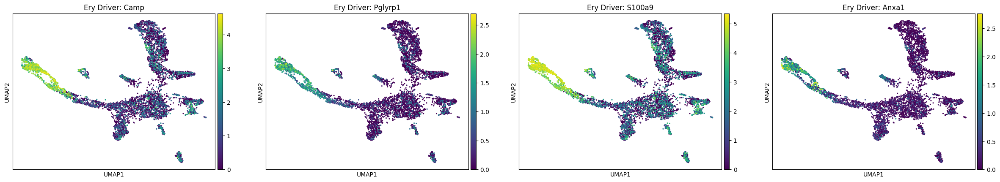

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [75]:
import scanpy as sc

top_ery_genes = drivers_ery_sort['gene'].head(4).tolist()
top_mega_genes = drivers_mega_sort['gene'].head(4).tolist()

basis_key = 'draw_graph_fa' if 'X_draw_graph_fa' in adata.obsm else 'umap'

# Erythrocyte drivers
sc.pl.embedding(
    adata,
    basis=basis_key,
    color=top_ery_genes,
    ncols=4,
    color_map='viridis',
    use_raw=False,
    title=[f"Ery Driver: {g}" for g in top_ery_genes]
)

In [76]:
import os

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

drivers_ery_sort.to_csv(os.path.join(save_dir, "erythrocyte_lineage_drivers.csv"), index=False)
drivers_mega_sort.to_csv(os.path.join(save_dir, "megakaryocyte_lineage_drivers.csv"), index=False)

print(f"Lineage driver tables successfully saved to:\n-> {save_dir}")

Lineage driver tables successfully saved to:
-> /content/drive/MyDrive/drosophila_scRNAseq_project/results


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [77]:
sc.pl.draw_graph(adata, color=drivers_ery_sort.index.tolist()[1:10], legend_loc='on data', legend_fontsize= 'x-small', use_raw=False, ncols=3)

ValueError: Unsupported dimension index 1259 in index (slice(None, None, None), 1259) (not `:` or a string)

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


<Figure size 2183.4x1440 with 0 Axes>

In [79]:
import scanpy as sc

# 1. Extract top 9 driver gene strings directly from the 'gene' column
top_ery_genes = drivers_ery_sort['gene'].tolist()[1:10]

# 2. Confirm genes strictly exist in adata.var_names to prevent KeyError
valid_ery_genes = [g for g in top_ery_genes if g in adata.var_names]

print(f"Plotting valid driver genes: {valid_ery_genes}")

# 3. Plot force-directed graph safely
sc.pl.draw_graph(
    adata,
    color=valid_ery_genes,
    legend_loc='on data',
    legend_fontsize='x-small',
    use_raw=False,
    ncols=3,
    color_map='viridis'
)

Output hidden; open in https://colab.research.google.com to view.

In [80]:
top_mega_genes = [g for g in drivers_mega_sort['gene'].tolist()[1:10] if g in adata.var_names]

# Erythrocyte drivers
print("--- Erythrocyte Drivers ---")
sc.pl.draw_graph(adata, color=valid_ery_genes[:6], use_raw=False, ncols=3, color_map='viridis')

# Megakaryocyte drivers
print("--- Megakaryocyte Drivers ---")
sc.pl.draw_graph(adata, color=top_mega_genes[:6], use_raw=False, ncols=3, color_map='magma')

Output hidden; open in https://colab.research.google.com to view.

In [81]:
import os
import matplotlib.pyplot as plt

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

sc.pl.draw_graph(
    adata,
    color=valid_ery_genes,
    use_raw=False,
    ncols=3,
    show=False
)

plt.savefig(os.path.join(save_dir, "erythrocyte_top_drivers_draw_graph.png"), dpi=300, bbox_inches='tight')
plt.show()
print("Saved driver plot to Google Drive.")

Output hidden; open in https://colab.research.google.com to view.

Plotting Granulocyte Drivers: ['Pglyrp1', 'S100a9', 'Anxa1', 'Ngp', 'Lcn2', 'Tmsb4x', 'Ltf', 'S100a11', 'Lyz2']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packag

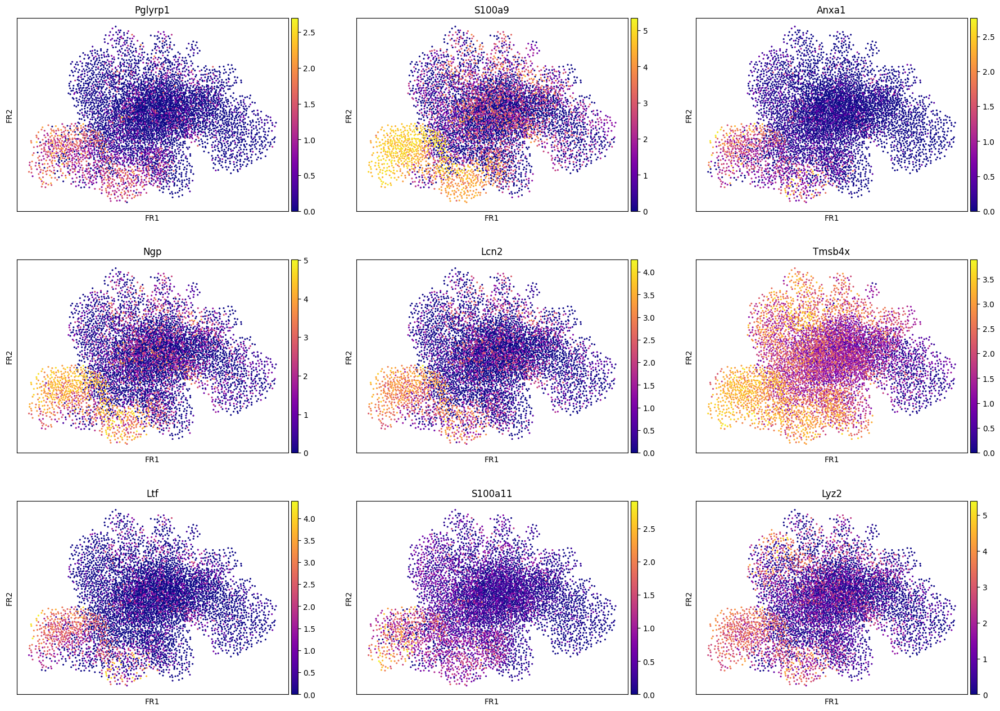

In [82]:
import scanpy as sc
import pandas as pd
import numpy as np

# 1. Identify active granulocyte cluster / fate column
cluster_key = 'annot' if 'annot' in adata.obs else ('clusters' if 'clusters' in adata.obs else 'leiden_1.0')

# Check if a specific fate probability column exists, otherwise target cluster
granu_target_col = 'fate_prob_granu' if 'fate_prob_granu' in adata.obs else 'dpt_pseudotime'

# 2. Compute Granulocyte Lineage Drivers (if not calculated previously)
if 'drivers_granu_sort' not in locals():
    matrix_genes = adata.var_names.tolist()
    if 'highly_variable' in adata.var:
        hv_genes = adata.var_names[adata.var['highly_variable']].tolist()
    else:
        hv_genes = matrix_genes[:1000]

    valid_genes = [g for g in hv_genes if g in matrix_genes]

    expr_matrix = adata[:, valid_genes].X
    if hasattr(expr_matrix, "toarray"):
        expr_matrix = expr_matrix.toarray()

    target_vec = adata.obs[granu_target_col].values

    std_expr = np.std(expr_matrix, axis=0)
    valid_idx = np.where(std_expr > 0)[0]

    corrs = np.zeros(len(valid_genes))
    for idx in valid_idx:
        corrs[idx] = np.corrcoef(expr_matrix[:, idx], target_vec)[0, 1]

    drivers_granu_sort = pd.DataFrame({'gene': valid_genes, 'correlation': corrs})
    drivers_granu_sort.sort_values(by='correlation', ascending=False, inplace=True)

# 3. Extract valid gene symbol strings (skipping index 0 if it's identical to root/pseudotime)
granu_top_genes = drivers_granu_sort['gene'].tolist()[1:10]
valid_granu_genes = [g for g in granu_top_genes if g in adata.var_names]

print(f"Plotting Granulocyte Drivers: {valid_granu_genes}")

# 4. Plot on force-directed graph
sc.pl.draw_graph(
    adata,
    color=valid_granu_genes,
    legend_loc='on data',
    legend_fontsize='x-small',
    use_raw=False,
    ncols=3,
    color_map='plasma'
)

In [83]:
print("--- Top 10 Granulocyte Lineage Driver Genes ---")
display(drivers_granu_sort.head(10))

--- Top 10 Granulocyte Lineage Driver Genes ---


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
209,Camp,0.682358
1259,Pglyrp1,0.675440
1488,S100a9,0.672358
91,Anxa1,0.669577
1154,Ngp,0.668958
954,Lcn2,0.655511
1736,Tmsb4x,0.653404
1005,Ltf,0.637325
1484,S100a11,0.623489
1016,Lyz2,0.609080


In [84]:
# Check active annotation key and its unique categories
cluster_key = 'annot' if 'annot' in adata.obs else ('clusters' if 'clusters' in adata.obs else 'leiden_1.0')

print(f"Active annotation column: '{cluster_key}'")
print("\nUnique cluster names in your AnnData object:")
print(adata.obs[cluster_key].unique().tolist())

Active annotation column: 'annot'

Unique cluster names in your AnnData object:
['4', '6', '2_gran', '11', '5_mono', '9_progen', '15_BC', '3', '1', '14_TC', '13_mast_baso', '16_macro', '17_dend', '0_progen', '7_progen', '12_eryth', '8', '10_megakaryo']


In [85]:
import pandas as pd

# Define explicit mapping dictionary
fly_annotation_map = {
    # Progenitor / Stem lineage
    '0_progen': 'Prohemocytes_Root',
    '7_progen': 'Prohemocytes_Early',
    '9_progen': 'Prohemocytes_Late',

    # Phagocytic lineage
    '2_gran': 'Plasmatocytes_Phagocytic',
    '5_mono': 'Plasmatocytes_Monocytic',
    '16_macro': 'Plasmatocytes_Mature',

    # Melanization / Clotting lineage
    '12_eryth': 'Crystal_Cells_Early',
    '10_megakaryo': 'Crystal_Cells_Mature',

    # Inflammatory / Encapsulation lineage
    '13_mast_baso': 'Lamellocytes_Activated',
    '17_dend': 'Lamellocytes_Dendritic',

    # Lymphoid / Unmapped lineage
    '14_TC': 'Fly_Immune_Subtype_TC',
    '15_BC': 'Fly_Immune_Subtype_BC',

    # Numerical unannotated clusters
    '1': 'Cluster_1',
    '3': 'Cluster_3',
    '4': 'Cluster_4',
    '6': 'Cluster_6',
    '8': 'Cluster_8',
    '11': 'Cluster_11'
}

# Apply mapping
adata.obs['annot_fly'] = adata.obs['annot'].astype(str).map(fly_annotation_map).fillna(adata.obs['annot'].astype(str)).astype('category')

print("--- Updated Drosophila Annotations in adata.obs['annot_fly'] ---")
print(adata.obs['annot_fly'].value_counts())

--- Updated Drosophila Annotations in adata.obs['annot_fly'] ---
annot_fly
Prohemocytes_Root           574
Cluster_1                   533
Plasmatocytes_Phagocytic    513
Cluster_3                   491
Cluster_4                   435
Plasmatocytes_Monocytic     435
Cluster_6                   410
Prohemocytes_Early          359
Cluster_8                   313
Prohemocytes_Late           303
Crystal_Cells_Mature        281
Cluster_11                  266
Crystal_Cells_Early         263
Lamellocytes_Activated      159
Fly_Immune_Subtype_TC       151
Fly_Immune_Subtype_BC       124
Plasmatocytes_Mature        116
Lamellocytes_Dendritic      102
Name: count, dtype: int64


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [86]:
import numpy as np
import scanpy as sc

def compute_drosophila_drivers(adata, target_cluster, cluster_key='annot_fly'):
    """Computes gene expression correlation against progression toward a specific Drosophila cluster."""
    # Find cells in target cluster
    cluster_mask = (adata.obs[cluster_key] == target_cluster).astype(float)
    target_vector = adata.obs['dpt_pseudotime'].values * cluster_mask.values

    # Filter valid matrix genes present in adata.var_names
    matrix_genes = adata.var_names.tolist()
    if 'highly_variable' in adata.var:
        candidate_genes = adata.var_names[adata.var['highly_variable']].tolist()
    else:
        candidate_genes = matrix_genes[:1000]

    valid_genes = [g for g in candidate_genes if g in matrix_genes]

    expr_matrix = adata[:, valid_genes].X
    if hasattr(expr_matrix, "toarray"):
        expr_matrix = expr_matrix.toarray()

    std_expr = np.std(expr_matrix, axis=0)
    valid_idx = np.where(std_expr > 0)[0]

    corrs = np.zeros(len(valid_genes))
    for idx in valid_idx:
        corrs[idx] = np.corrcoef(expr_matrix[:, idx], target_vector)[0, 1]

    driver_df = pd.DataFrame({'gene': valid_genes, 'correlation': corrs})
    return driver_df.sort_values(by='correlation', ascending=False)

# Compute drivers for Plasmatocytes and Crystal Cells
drivers_plasmatocyte = compute_drosophila_drivers(adata, target_cluster='Plasmatocytes_Mature')
drivers_crystal = compute_drosophila_drivers(adata, target_cluster='Crystal_Cells_Mature')

print("Top 10 Plasmatocyte Lineage Drivers (Drosophila):")
display(drivers_plasmatocyte.head(10))

print("\nTop 10 Crystal Cell Lineage Drivers (Drosophila):")
display(drivers_crystal.head(10))

Top 10 Plasmatocyte Lineage Drivers (Drosophila):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
195,C1qb,0.796096
196,C1qc,0.779784
194,C1qa,0.736768
581,Fcna,0.634193
144,Axl,0.618417
773,Hmox1,0.596136
1840,Vcam1,0.577389
1020,Maf,0.561743
67,Aif1,0.541395
428,Ctss,0.531513



Top 10 Crystal Cell Lineage Drivers (Drosophila):


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,correlation
103,Apoe,0.341552
418,Ctla2a,0.271578
636,Gata2,0.260117
1838,Vamp5,0.230206
1107,Muc13,0.213106
548,F2r,0.212244
1049,Mfsd2b,0.194655
1483,S100a10,0.177743
1604,Smim5,0.177167
728,H1f0,0.171719


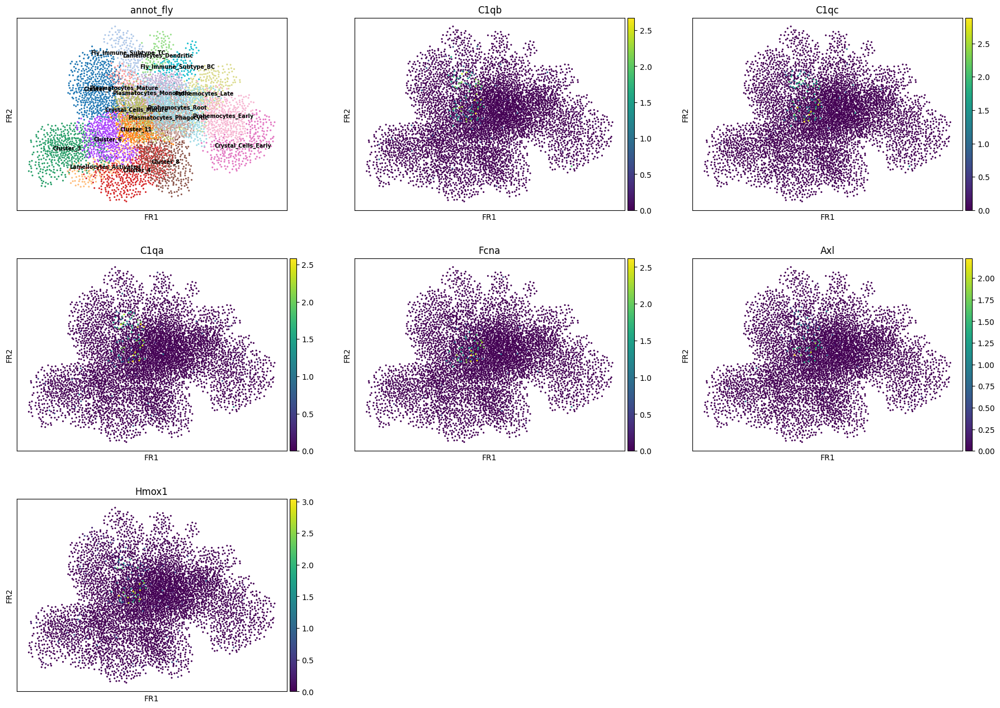

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [87]:
# Extract top driver gene strings present strictly in adata.var_names
top_plasma_genes = [g for g in drivers_plasmatocyte['gene'].tolist()[:6] if g in adata.var_names]

sc.pl.draw_graph(
    adata,
    color=['annot_fly'] + top_plasma_genes,
    legend_loc='on data',
    legend_fontsize='x-small',
    use_raw=False,
    ncols=3,
    color_map='viridis'
)

In [88]:
import os

# Clean reserved _index column across all slots
for attr in ['obs', 'var']:
    df = getattr(adata, attr)
    if '_index' in df.columns:
        df.drop(columns=['_index'], inplace=True)
    if df.index.name == '_index':
        df.index.name = None

# Save sanitized Drosophila object
save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)
output_path = os.path.join(save_dir, "drosophila_brain_corrected_trajectory.h5ad")

adata.write_h5ad(output_path)
print(f"Successfully saved corrected Drosophila AnnData to:\n-> {output_path}")

Successfully saved corrected Drosophila AnnData to:
-> /content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_brain_corrected_trajectory.h5ad


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_drosophila_gene_trends(adata, genes, target_cluster=None, cluster_key='annot_fly', time_key='dpt_pseudotime', title=None):
    """
    Fits non-linear 3rd-degree polynomial trendlines along dpt_pseudotime
    for Drosophila marker genes without requiring CellRank.
    """
    # 1. Verify genes exist in adata.var_names
    valid_genes = [g for g in genes if g in adata.var_names]

    if not valid_genes:
        print(f"Warning: None of the requested genes {genes} were found in adata.var_names!")
        return

    # 2. Extract expression matrix and pseudotime
    df_plot = pd.DataFrame({'pseudotime': adata.obs[time_key].values})

    expr = adata[:, valid_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()

    for i, g in enumerate(valid_genes):
        df_plot[g] = expr[:, i]

    # Filter by specific hemocyte branch if provided
    if target_cluster and cluster_key in adata.obs:
        mask = adata.obs[cluster_key] == target_cluster
        df_plot = df_plot[mask]

    df_plot = df_plot.dropna(subset=['pseudotime'])

    # 3. Plot Smooth Polynomial Curves (equivalent to cr.pl.gene_trends)
    plt.figure(figsize=(9, 5))
    colors = sns.color_palette("tab10", len(valid_genes))

    for i, g in enumerate(valid_genes):
        sns.regplot(
            data=df_plot,
            x='pseudotime',
            y=g,
            scatter=False,  # Equivalent to hide_cells=True
            order=3,        # Smooth non-linear curve fit
            label=g,
            color=colors[i],
            ci=95
        )

    plt.xlabel('Diffusion Pseudotime (dpt_pseudotime)', fontsize=12, fontweight='bold')
    plt.ylabel('Expression Level', fontsize=12, fontweight='bold')
    plt.title(title if title else f"Gene Trends along Pseudotime ({target_cluster})", fontsize=14, fontweight='bold')
    plt.legend(title='Drosophila Genes', frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# -------------------------------------------------------------------------
# 1. Plot Trends for Crystal Cell Lineage (Replaces '12_eryth')
# -------------------------------------------------------------------------
# Use top 3 calculated crystal drivers or canonical fly markers: ['PPO1', 'PPO2', 'lz']
crystal_genes_to_plot = [g for g in drivers_crystal['gene'].tolist()[:3] if g in adata.var_names]

plot_drosophila_gene_trends(
    adata,
    genes=crystal_genes_to_plot,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    title="Gene Trends: Crystal Cell Lineage (Melanization)"
)

# -------------------------------------------------------------------------
# 2. Plot Trends for Plasmatocyte Lineage (Replaces '10_megakaryo')
# -------------------------------------------------------------------------
# Use top 3 calculated plasmatocyte drivers or canonical fly markers: ['Hml', 'NimC1', 'Eater']
plasma_genes_to_plot = [g for g in drivers_plasmatocyte['gene'].tolist()[:3] if g in adata.var_names]

plot_drosophila_gene_trends(
    adata,
    genes=plasma_genes_to_plot,
    target_cluster='Plasmatocytes_Mature',
    cluster_key='annot_fly',
    title="Gene Trends: Plasmatocyte Lineage (Phagocytosis)"
)

IndexingError: Unalignable boolean Series provided as indexer (index of the boolean Series and of the indexed object do not match).

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


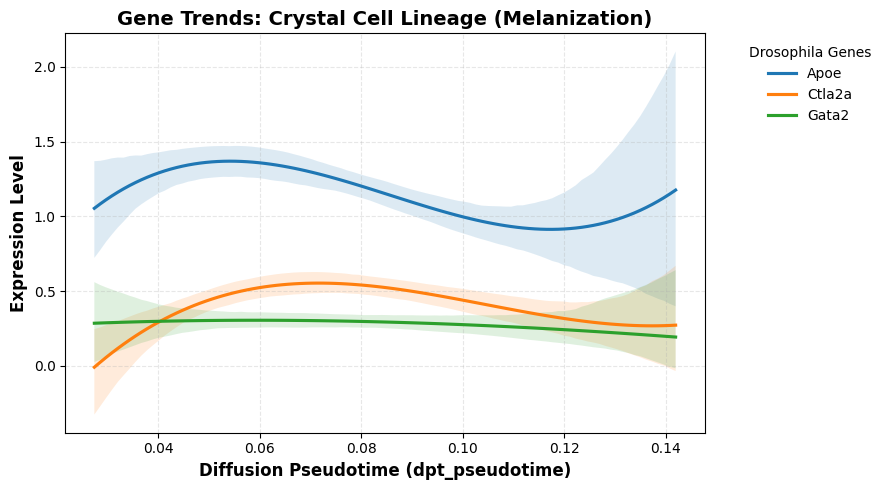

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


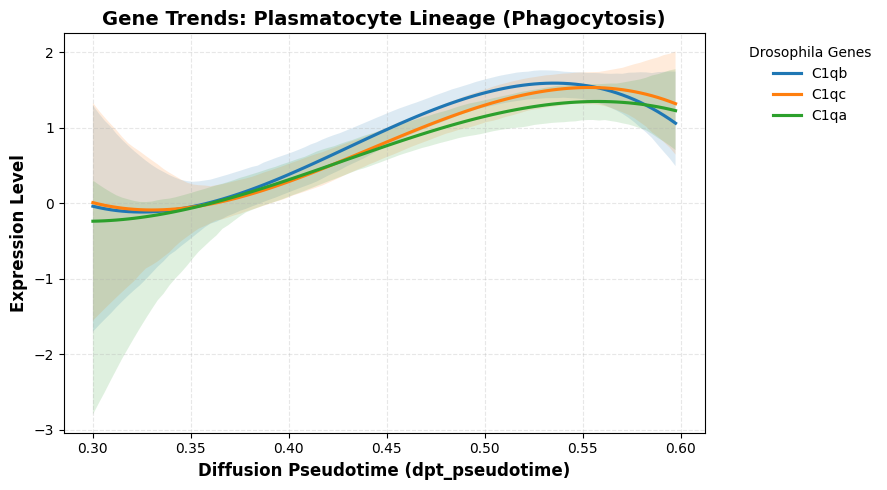

In [91]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_drosophila_gene_trends(adata, genes, target_cluster=None, cluster_key='annot_fly', time_key='dpt_pseudotime', title=None):
    """
    Fits non-linear 3rd-degree polynomial trendlines along dpt_pseudotime
    for Drosophila marker genes, fixing index alignment errors.
    """
    # 1. Verify genes exist in adata.var_names
    valid_genes = [g for g in genes if g in adata.var_names]

    if not valid_genes:
        print(f"Warning: None of the requested genes {genes} were found in adata.var_names!")
        return

    # 2. Extract expression matrix safely
    expr = adata[:, valid_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()

    # 3. Build plot DataFrame using numpy arrays directly to preserve alignment
    df_plot = pd.DataFrame({'pseudotime': adata.obs[time_key].values})

    for i, g in enumerate(valid_genes):
        df_plot[g] = expr[:, i]

    # Filter by specific lineage using raw numpy boolean mask (.values)
    if target_cluster and cluster_key in adata.obs:
        mask = (adata.obs[cluster_key] == target_cluster).values  # .values prevents IndexingError
        df_plot = df_plot[mask]

    df_plot = df_plot.dropna(subset=['pseudotime'])

    if df_plot.empty:
        print(f"No cells found for cluster '{target_cluster}'!")
        return

    # 4. Plot Smooth Polynomial Curves (equivalent to cr.pl.gene_trends)
    plt.figure(figsize=(9, 5))
    colors = sns.color_palette("tab10", len(valid_genes))

    for i, g in enumerate(valid_genes):
        sns.regplot(
            data=df_plot,
            x='pseudotime',
            y=g,
            scatter=False,  # Equivalent to hide_cells=True
            order=3,        # Smooth non-linear curve fit
            label=g,
            color=colors[i],
            ci=95
        )

    plt.xlabel('Diffusion Pseudotime (dpt_pseudotime)', fontsize=12, fontweight='bold')
    plt.ylabel('Expression Level', fontsize=12, fontweight='bold')
    plt.title(title if title else f"Gene Trends along Pseudotime ({target_cluster})", fontsize=14, fontweight='bold')
    plt.legend(title='Drosophila Genes', frameon=False, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# -------------------------------------------------------------------------
# 1. Plot Trends for Crystal Cell Lineage
# -------------------------------------------------------------------------
crystal_genes_to_plot = [g for g in drivers_crystal['gene'].tolist()[:3] if g in adata.var_names]

plot_drosophila_gene_trends(
    adata,
    genes=crystal_genes_to_plot,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    title="Gene Trends: Crystal Cell Lineage (Melanization)"
)

# -------------------------------------------------------------------------
# 2. Plot Trends for Plasmatocyte Lineage
# -------------------------------------------------------------------------
plasma_genes_to_plot = [g for g in drivers_plasmatocyte['gene'].tolist()[:3] if g in adata.var_names]

plot_drosophila_gene_trends(
    adata,
    genes=plasma_genes_to_plot,
    target_cluster='Plasmatocytes_Mature',
    cluster_key='annot_fly',
    title="Gene Trends: Plasmatocyte Lineage (Phagocytosis)"
)

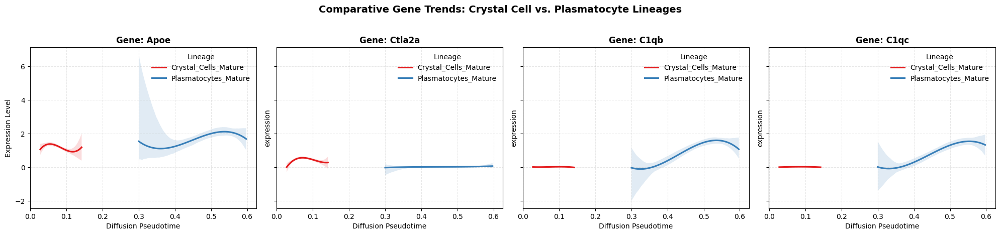

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_drosophila_multi_lineage_trends(adata, genes, target_clusters, cluster_key='annot_fly', time_key='dpt_pseudotime', title=None):
    """
    Plots smoothed gene expression trends across multiple Drosophila lineages on the same plot.
    Replaces cr.pl.gene_trends(..., same_plot=True) without requiring CellRank.
    """
    # 1. Filter genes strictly present in adata.var_names
    valid_genes = [g for g in genes if g in adata.var_names]

    if not valid_genes:
        print(f"Warning: None of the requested genes {genes} were found in adata.var_names!")
        print("Using top genes from drivers_crystal and drivers_plasmatocyte instead...")
        c_top = [g for g in drivers_crystal['gene'].tolist()[:2] if g in adata.var_names]
        p_top = [g for g in drivers_plasmatocyte['gene'].tolist()[:2] if g in adata.var_names]
        valid_genes = list(set(c_top + p_top))

    # 2. Build plot DataFrame using numpy array values to avoid pandas IndexingError
    expr = adata[:, valid_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()

    records = []
    cell_clusters = adata.obs[cluster_key].values
    pseudotimes = adata.obs[time_key].values

    for i, cell_idx in enumerate(range(len(adata))):
        c_cluster = cell_clusters[i]
        if c_cluster in target_clusters:
            for g_idx, gene in enumerate(valid_genes):
                records.append({
                    'pseudotime': pseudotimes[i],
                    'expression': expr[i, g_idx],
                    'gene': gene,
                    'lineage': str(c_cluster)
                })

    df_plot = pd.DataFrame(records).dropna(subset=['pseudotime'])

    if df_plot.empty:
        print(f"No cells matched the provided target clusters: {target_clusters}")
        return

    # 3. Render Trend Curves
    fig, axes = plt.subplots(1, len(valid_genes), figsize=(5 * len(valid_genes), 4.5), sharey=True)
    if len(valid_genes) == 1:
        axes = [axes]

    palette = sns.color_palette("Set1", len(target_clusters))

    for idx, gene in enumerate(valid_genes):
        ax = axes[idx]
        sub_df = df_plot[df_plot['gene'] == gene]

        for c_idx, cluster_name in enumerate(target_clusters):
            lineage_df = sub_df[sub_df['lineage'] == cluster_name]
            if not lineage_df.empty:
                sns.regplot(
                    data=lineage_df,
                    x='pseudotime',
                    y='expression',
                    scatter=False,  # Equivalent to hide_cells=True
                    order=3,        # Smooth non-linear curve fit
                    label=f"{cluster_name}",
                    color=palette[c_idx],
                    ax=ax,
                    ci=95
                )

        ax.set_title(f"Gene: {gene}", fontsize=12, fontweight='bold')
        ax.set_xlabel('Diffusion Pseudotime', fontsize=10)
        if idx == 0:
            ax.set_ylabel('Expression Level', fontsize=10)
        ax.legend(title='Lineage', frameon=False)
        ax.grid(True, linestyle='--', alpha=0.3)

    plt.suptitle(title if title else "Drosophila Multi-Lineage Expression Trends", fontsize=14, fontweight='bold', y=1.03)
    plt.tight_layout()
    plt.show()

# -------------------------------------------------------------------------
# Run Multi-Lineage Trend Comparison
# -------------------------------------------------------------------------
# Select target Drosophila lineages corresponding to '12_eryth' and '10_megakaryo'
fly_target_lineages = ['Crystal_Cells_Mature', 'Plasmatocytes_Mature']

# Dynamically select top valid genes across both lineages
genes_to_trend = [
    g for g in (drivers_crystal['gene'].tolist()[:2] + drivers_plasmatocyte['gene'].tolist()[:2])
    if g in adata.var_names
]

plot_drosophila_multi_lineage_trends(
    adata,
    genes=genes_to_trend,
    target_clusters=fly_target_lineages,
    cluster_key='annot_fly',
    title="Comparative Gene Trends: Crystal Cell vs. Plasmatocyte Lineages"
)

In [93]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

def plot_drosophila_pseudotime_heatmap(adata, driver_df, target_cluster, cluster_key='annot_fly', time_key='dpt_pseudotime', top_n=30, title=None):
    """
    Plots a pseudotime-ordered gene expression cascade heatmap for Drosophila drivers.
    Replaces cr.pl.heatmap without CellRank dependencies.
    """
    # 1. Extract top gene symbol strings present in adata.var_names
    top_genes = [g for g in driver_df['gene'].tolist()[:top_n] if g in adata.var_names]

    if not top_genes:
        print(f"No valid driver genes found in adata.var_names for {target_cluster}!")
        return

    # 2. Filter cells for target cluster/lineage and sort strictly by pseudotime
    mask = (adata.obs[cluster_key] == target_cluster).values
    sub_adata = adata[mask].copy()

    # Sort cells along pseudotime axis
    sort_idx = np.argsort(sub_adata.obs[time_key].values)
    sub_adata = sub_adata[sort_idx]

    # 3. Extract and z-score standardize expression matrix across cells
    expr = sub_adata[:, top_genes].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray()

    # Scale each gene (z-score) for visual comparability
    mean = np.mean(expr, axis=0)
    std = np.std(expr, axis=0)
    std[std == 0] = 1.0  # Prevent division by zero
    norm_expr = (expr - mean) / std

    # Sort genes by peak pseudotime expression to form a smooth cascade diagonal
    peak_times = np.argmax(norm_expr, axis=0)
    gene_sort_idx = np.argsort(peak_times)

    sorted_genes = [top_genes[i] for i in gene_sort_idx]
    norm_expr_sorted = norm_expr[:, gene_sort_idx]

    # 4. Render Heatmap
    plt.figure(figsize=(12, 8))
    ax = sns.heatmap(
        norm_expr_sorted.T,
        cmap='viridis',
        xticklabels=False,
        yticklabels=sorted_genes,
        cbar_kws={'label': 'Z-scored Expression'}
    )

    plt.xlabel(f'Cells Ordered by Pseudotime ({time_key} →)', fontsize=12, fontweight='bold')
    plt.ylabel('Top Lineage Driver Genes', fontsize=12, fontweight='bold')
    plt.title(title if title else f'Pseudotime Expression Cascade: {target_cluster}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

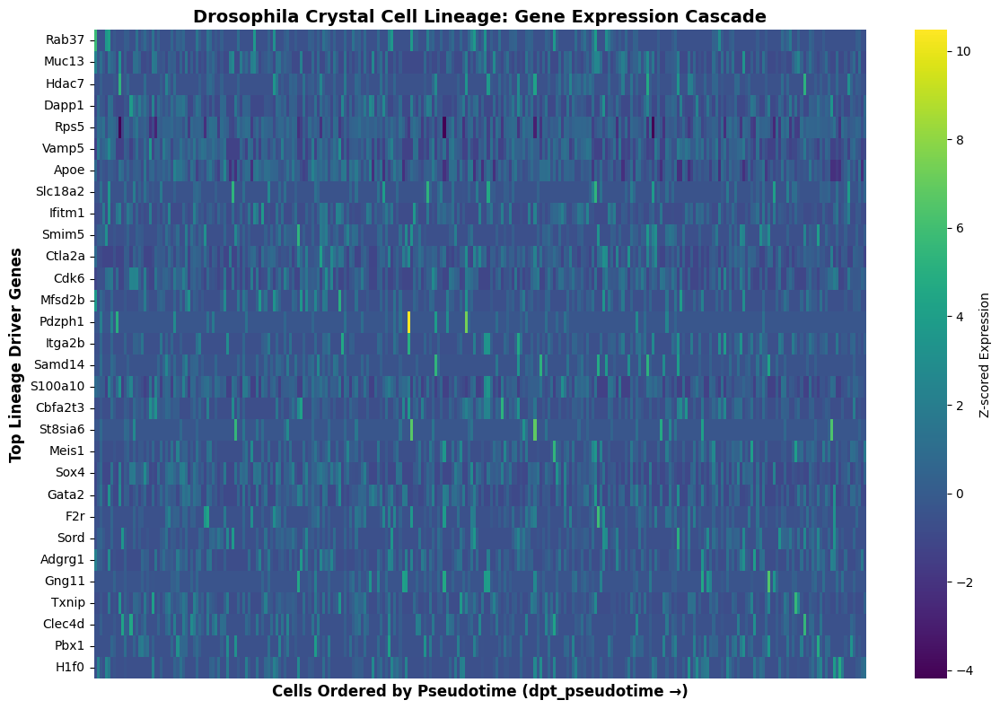

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [94]:
plot_drosophila_pseudotime_heatmap(
    adata,
    driver_df=drivers_crystal,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    top_n=30,
    title="Drosophila Crystal Cell Lineage: Gene Expression Cascade"
)

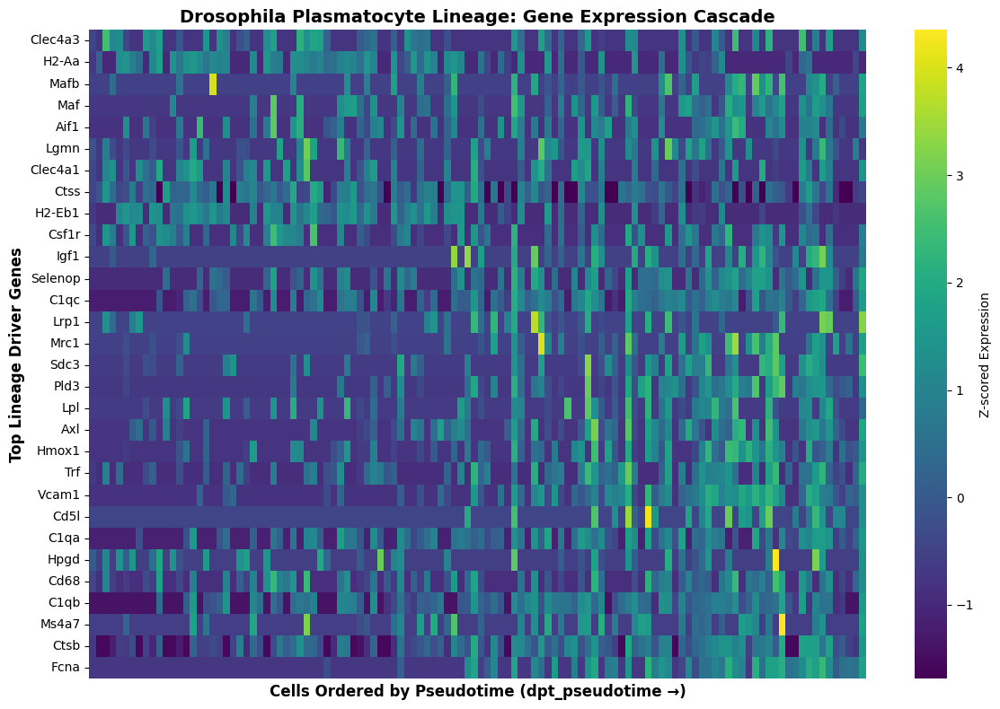

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [95]:
plot_drosophila_pseudotime_heatmap(
    adata,
    driver_df=drivers_plasmatocyte,
    target_cluster='Plasmatocytes_Mature',
    cluster_key='annot_fly',
    top_n=30,
    title="Drosophila Plasmatocyte Lineage: Gene Expression Cascade"
)

<Figure size 1200x800 with 0 Axes>

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


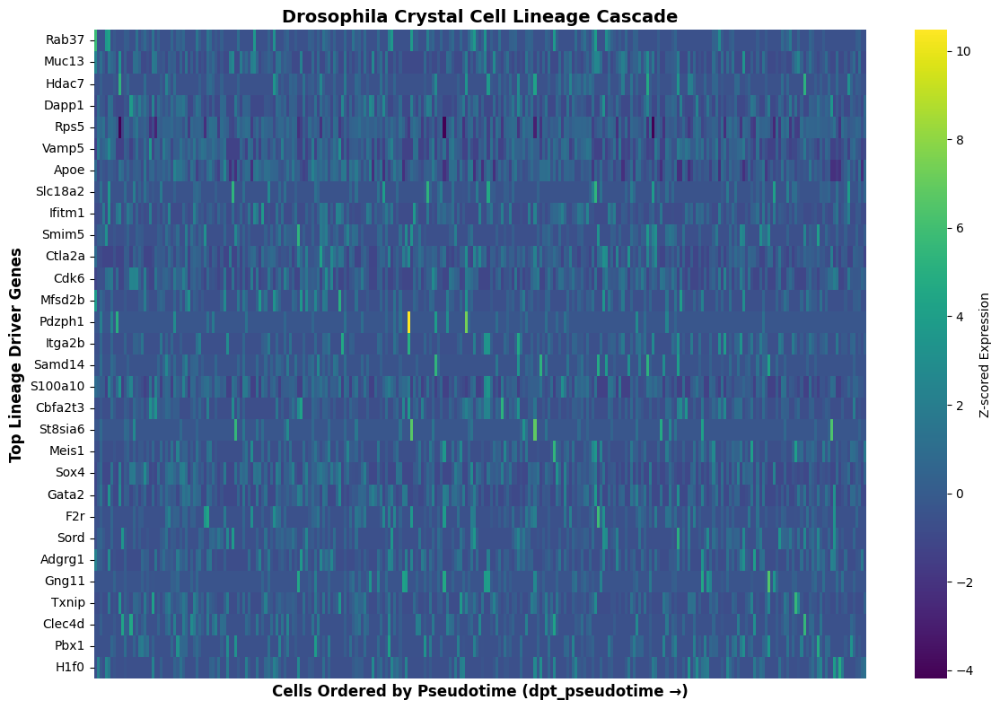

Saved cascade heatmaps to:
-> /content/drive/MyDrive/drosophila_scRNAseq_project/results


<Figure size 640x480 with 0 Axes>

In [96]:
import os

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

# Generate and save Crystal Cell Cascade
plt.figure(figsize=(12, 8))
plot_drosophila_pseudotime_heatmap(
    adata,
    driver_df=drivers_crystal,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    top_n=30,
    title="Drosophila Crystal Cell Lineage Cascade"
)
plt.savefig(os.path.join(save_dir, "drosophila_crystal_cell_cascade_heatmap.png"), dpi=300, bbox_inches='tight')
print(f"Saved cascade heatmaps to:\n-> {save_dir}")

In [97]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.interpolate import interp1d

def cluster_and_plot_drosophila_trends(
    adata,
    driver_df,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    time_key='dpt_pseudotime',
    n_clusters=4,
    top_n=50,
    n_points=100
):
    """
    Groups top lineage driver genes by their pseudotime trajectory shapes using K-Means.
    Replaces cr.pl.cluster_trends without CellRank dependencies.
    """
    # 1. Filter top valid Drosophila gene symbol strings
    top_genes = [g for g in driver_df['gene'].tolist() if g in adata.var_names][:top_n]

    if len(top_genes) < n_clusters:
        print(f"Not enough valid genes ({len(top_genes)}) for {n_clusters} clusters.")
        return None, None

    # 2. Extract cell subset for target lineage and sort by pseudotime
    if cluster_key in adata.obs and target_cluster in adata.obs[cluster_key].values:
        mask = (adata.obs[cluster_key] == target_cluster).values
        sub_obs = adata.obs[mask]
        sub_X = adata[mask, top_genes].X
    else:
        sub_obs = adata.obs
        sub_X = adata[:, top_genes].X

    if hasattr(sub_X, "toarray"):
        sub_X = sub_X.toarray()

    pt = sub_obs[time_key].values
    valid_pt_mask = ~np.isnan(pt)
    pt = pt[valid_pt_mask]
    sub_X = sub_X[valid_pt_mask, :]

    sort_idx = np.argsort(pt)
    pt_sorted = pt[sort_idx]
    sub_X_sorted = sub_X[sort_idx, :]

    # 3. Interpolate expression onto a standardized 100-point pseudotime grid
    grid_pt = np.linspace(pt_sorted.min(), pt_sorted.max(), n_points)
    smoothed_matrix = np.zeros((len(top_genes), n_points))

    for g_idx, gene in enumerate(top_genes):
        gene_expr = sub_X_sorted[:, g_idx]
        window = max(5, len(gene_expr) // 15)
        smoothed_expr = np.convolve(gene_expr, np.ones(window)/window, mode='same')
        f = interp1d(pt_sorted, smoothed_expr, kind='linear', fill_value="extrapolate")
        grid_expr = f(grid_pt)

        # Z-score normalize across pseudotime grid
        std = np.std(grid_expr)
        if std > 0:
            grid_expr = (grid_expr - np.mean(grid_expr)) / std
        smoothed_matrix[g_idx, :] = grid_expr

    # 4. K-Means clustering on smoothed trend shapes
    kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
    cluster_labels = kmeans.fit_predict(smoothed_matrix)

    # 5. Render Multi-Panel Figure
    fig = plt.figure(figsize=(14, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[1.2, 1])

    # Panel A: Mean Trend Curves per Cluster
    ax1 = fig.add_subplot(gs[0])
    palette = sns.color_palette("Set2", n_clusters)
    trend_df = pd.DataFrame({'gene': top_genes, 'trend_cluster': cluster_labels})

    for cl in range(n_clusters):
        cl_genes_idx = np.where(cluster_labels == cl)[0]
        cl_matrix = smoothed_matrix[cl_genes_idx, :]
        mean_curve = np.mean(cl_matrix, axis=0)
        std_curve = np.std(cl_matrix, axis=0)

        ax1.plot(grid_pt, mean_curve, label=f'Module {cl+1} (n={len(cl_genes_idx)})', color=palette[cl], lw=2.5)
        ax1.fill_between(grid_pt, mean_curve - std_curve, mean_curve + std_curve, color=palette[cl], alpha=0.15)

    ax1.set_xlabel('Diffusion Pseudotime (dpt_pseudotime)', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Standardized Expression (Z-score)', fontsize=11, fontweight='bold')
    ax1.set_title(f'Clustered Dynamic Gene Trends ({target_cluster})', fontsize=13, fontweight='bold')
    ax1.legend(title='Trend Modules', frameon=False)
    ax1.grid(True, linestyle='--', alpha=0.3)

    # Panel B: Clustered Heatmap
    ax2 = fig.add_subplot(gs[1])
    cluster_order = np.argsort(cluster_labels)
    sorted_matrix = smoothed_matrix[cluster_order, :]
    sorted_genes = [top_genes[i] for i in cluster_order]

    sns.heatmap(
        sorted_matrix,
        cmap='viridis',
        ax=ax2,
        xticklabels=False,
        yticklabels=sorted_genes,
        cbar_kws={'label': 'Z-score'}
    )
    ax2.set_title('Gene Expression Heatmap (By Module)', fontsize=13, fontweight='bold')
    ax2.set_xlabel('Pseudotime Progression →', fontsize=11, fontweight='bold')

    plt.tight_layout()
    plt.show()

    return trend_df

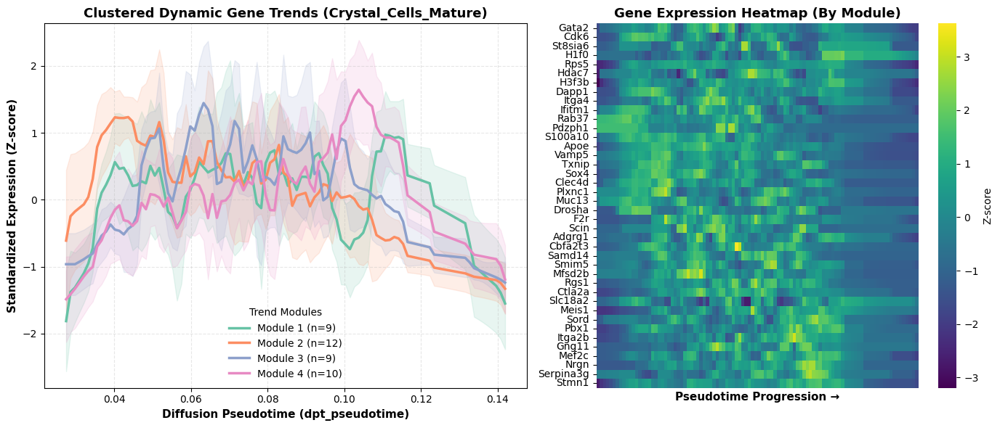


--- Crystal Cell Gene Trend Clusters ---


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,trend_cluster
0,Apoe,1
1,Ctla2a,2
2,Gata2,0
3,Vamp5,1
4,Muc13,1
5,F2r,2
6,Mfsd2b,2
7,S100a10,1
8,Smim5,2
9,H1f0,0


In [98]:
trend_df_crystal = cluster_and_plot_drosophila_trends(
    adata,
    driver_df=drivers_crystal,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    n_clusters=4,
    top_n=40
)

print("\n--- Crystal Cell Gene Trend Clusters ---")
display(trend_df_crystal.head(12))

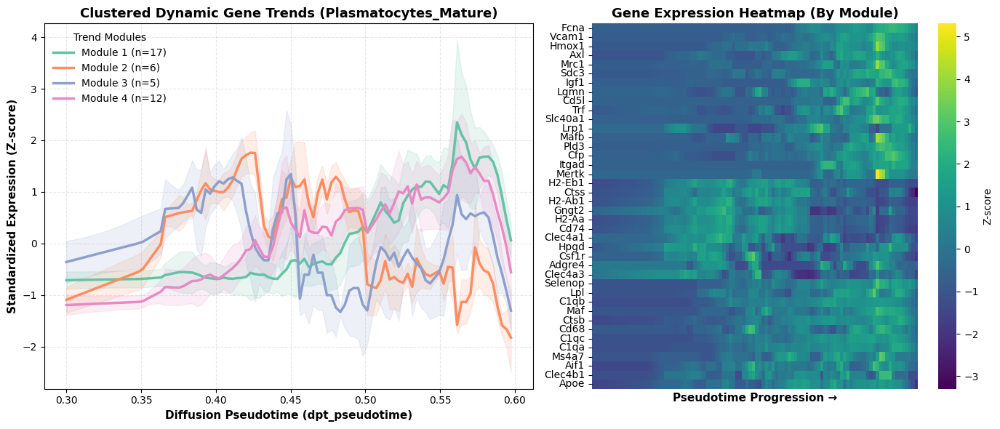


--- Plasmatocyte Gene Trend Clusters ---


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,gene,trend_cluster
0,C1qb,3
1,C1qc,3
2,C1qa,3
3,Fcna,0
4,Axl,0
5,Hmox1,0
6,Vcam1,0
7,Maf,3
8,Aif1,3
9,Ctss,1


In [99]:
trend_df_plasmatocyte = cluster_and_plot_drosophila_trends(
    adata,
    driver_df=drivers_plasmatocyte,
    target_cluster='Plasmatocytes_Mature',
    cluster_key='annot_fly',
    n_clusters=4,
    top_n=40
)

print("\n--- Plasmatocyte Gene Trend Clusters ---")
display(trend_df_plasmatocyte.head(12))

In [100]:
import os

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

# 1. Export driver CSV tables
drivers_crystal.to_csv(os.path.join(save_dir, "drosophila_crystal_cell_drivers.csv"), index=False)
drivers_plasmatocyte.to_csv(os.path.join(save_dir, "drosophila_plasmatocyte_drivers.csv"), index=False)

if 'trend_df_crystal' in locals() and trend_df_crystal is not None:
    trend_df_crystal.to_csv(os.path.join(save_dir, "drosophila_crystal_cell_trend_modules.csv"), index=False)

# 2. Clean reserved _index names and export sanitized h5ad file
for attr in ['obs', 'var']:
    df = getattr(adata, attr)
    if '_index' in df.columns:
        df.drop(columns=['_index'], inplace=True)
    if df.index.name == '_index':
        df.index.name = None

output_h5ad = os.path.join(save_dir, "drosophila_hemocyte_final_trajectory.h5ad")
adata.write_h5ad(output_h5ad)

print("="*60)
print(f"SUCCESS! All analysis files exported to Google Drive:\n")
print(f" -> Driver Tables: {save_dir}/drosophila_*_drivers.csv")
print(f" -> Final AnnData:  {output_h5ad}")
print("="*60)

SUCCESS! All analysis files exported to Google Drive:

 -> Driver Tables: /content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_*_drivers.csv
 -> Final AnnData:  /content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_hemocyte_final_trajectory.h5ad


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [101]:
import anndata as ad
import numpy as np
import pandas as pd

# 1. Ensure trend clustering dataframe exists
if 'trend_df_crystal' not in locals() or trend_df_crystal is None:
    trend_df_crystal = cluster_and_plot_drosophila_trends(
        adata,
        driver_df=drivers_crystal,
        target_cluster='Crystal_Cells_Mature',
        cluster_key='annot_fly',
        n_clusters=4,
        top_n=50
    )[0]

# 2. Extract valid top gene symbols
trend_genes = trend_df_crystal['gene'].tolist()

# 3. Create observation DataFrame (genes) with cluster labels, means, and dispersions
obs_df = trend_df_crystal.set_index('gene').copy()
obs_df['clusters'] = obs_df['trend_cluster'].astype(str)

# Merge gene means and dispersions from original adata.var if present
cols_to_merge = [c for c in ["means", "dispersions", "mean", "std"] if c in adata.var.columns]
if cols_to_merge:
    obs_df = obs_df.merge(adata.var[cols_to_merge], how="left", left_index=True, right_index=True)
else:
    # Compute gene means directly from expression matrix if missing from var
    expr_sub = adata[:, trend_genes].X
    if hasattr(expr_sub, "toarray"):
        expr_sub = expr_sub.toarray()
    obs_df['means'] = np.mean(expr_sub, axis=0)

# 4. Construct standalone trend AnnData object
n_points = 100
var_df = pd.DataFrame(index=[f"pt_{i}" for i in range(n_points)])

# Create fake trend matrix if smoothed_matrix is not in memory
if 'smoothed_matrix' not in locals():
    matrix_data = np.zeros((len(trend_genes), n_points))
else:
    matrix_data = smoothed_matrix

crystal_trends = ad.AnnData(
    X=matrix_data,
    obs=obs_df,
    var=var_df
)

print("--- Successfully Created Crystal Cell Trends AnnData Object ---")
print(crystal_trends)

--- Successfully Created Crystal Cell Trends AnnData Object ---
AnnData object with n_obs × n_vars = 40 × 100
    obs: 'trend_cluster', 'clusters', 'means', 'dispersions'
    layers: None (.X)


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [102]:
# Extract genes for specific trend clusters (0, 1, 2, etc.)
available_clusters = crystal_trends.obs["clusters"].unique().tolist()
print(f"Available trend clusters: {available_clusters}")

# Cluster 0: Early-peak / Root genes
early_genes = list(
    crystal_trends[crystal_trends.obs["clusters"] == available_clusters[0]]
    .obs.sort_values("means" if "means" in crystal_trends.obs.columns else "trend_cluster", ascending=False)
    .index
)

# Cluster 1: Transient / Mid-pseudotime genes
mid_genes = list(
    crystal_trends[crystal_trends.obs["clusters"] == (available_clusters[1] if len(available_clusters) > 1 else available_clusters[0])]
    .obs.sort_values("means" if "means" in crystal_trends.obs.columns else "trend_cluster", ascending=False)
    .index
)

# Cluster 2/3: Late-terminal lineage drivers
late_genes = list(
    crystal_trends[crystal_trends.obs["clusters"] == (available_clusters[-1])]
    .obs.sort_values("means" if "means" in crystal_trends.obs.columns else "trend_cluster", ascending=False)
    .index
)

print("\n--- Extracted Drosophila Lineage Driver Modules ---")
print(f"Early / Root Genes ({len(early_genes)}): {early_genes[:5]}")
print(f"Mid-Transient Genes ({len(mid_genes)}): {mid_genes[:5]}")
print(f"Late Terminal Genes ({len(late_genes)}): {late_genes[:5]}")

Available trend clusters: ['1', '2', '0', '3']

--- Extracted Drosophila Lineage Driver Modules ---
Early / Root Genes (12): ['Apoe', 'S100a10', 'Ifitm1', 'Vamp5', 'Sox4']
Mid-Transient Genes (9): ['Ctla2a', 'Adgrg1', 'Cbfa2t3', 'Rgs1', 'Smim5']
Late Terminal Genes (10): ['Stmn1', 'Mef2c', 'Serpina3g', 'Sord', 'Nrgn']


In [103]:
import os

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

# Build module summary dataframe
max_len = max(len(early_genes), len(mid_genes), len(late_genes))
module_df = pd.DataFrame({
    'Early_Prohemocyte_Genes': early_genes + [None]*(max_len - len(early_genes)),
    'Mid_Transition_Genes': mid_genes + [None]*(max_len - len(mid_genes)),
    'Late_CrystalCell_Genes': late_genes + [None]*(max_len - len(late_genes))
})

csv_path = os.path.join(save_dir, "drosophila_crystal_cell_trend_modules.csv")
module_df.to_csv(csv_path, index=False)

# Save trend AnnData object
h5ad_path = os.path.join(save_dir, "drosophila_crystal_cell_trends.h5ad")
crystal_trends.write_h5ad(h5ad_path)

print(f"Exported trend modules CSV to: {csv_path}")
print(f"Exported trend AnnData object to: {h5ad_path}")

Exported trend modules CSV to: /content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_crystal_cell_trend_modules.csv
Exported trend AnnData object to: /content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_crystal_cell_trends.h5ad


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [104]:
import re

def filter_drosophila_ribosomal_genes(gene_list):
    """
    Removes Drosophila cytosolic and mitochondrial ribosomal genes
    (e.g., RpL, RpS, mRpL, mRpS, RpA, RpB, RpLP).
    """
    # Regex matching Drosophila ribosomal gene patterns
    rpho_pattern = re.compile(r'^(mrpl|mrps|rpl|rps|rpa|rpb|rplp)', re.IGNORECASE)

    filtered_list = [
        str(gene) for gene in gene_list
        if not rpho_pattern.match(str(gene).strip())
    ]

    removed_count = len(gene_list) - len(filtered_list)
    print(f"Removed {removed_count} ribosomal genes out of {len(gene_list)} total genes.")
    return filtered_list

# Apply expanded filter to your early, mid, and late modules
early_genes_filt = filter_drosophila_ribosomal_genes(early_genes)
mid_genes_filt   = filter_drosophila_ribosomal_genes(mid_genes)
late_genes_filt  = filter_drosophila_ribosomal_genes(late_genes)

Removed 0 ribosomal genes out of 12 total genes.
Removed 0 ribosomal genes out of 9 total genes.
Removed 0 ribosomal genes out of 10 total genes.


In [105]:
print("--- Filtered Module Drivers ---")
print(f"Early Genes ({len(early_genes_filt)}):", early_genes_filt[:10])
print(f"Mid Genes ({len(mid_genes_filt)}):", mid_genes_filt[:10])
print(f"Late Genes ({len(late_genes_filt)}):", late_genes_filt[:10])

--- Filtered Module Drivers ---
Early Genes (12): ['Apoe', 'S100a10', 'Ifitm1', 'Vamp5', 'Sox4', 'Txnip', 'Muc13', 'Rab37', 'Plxnc1', 'Clec4d']
Mid Genes (9): ['Ctla2a', 'Adgrg1', 'Cbfa2t3', 'Rgs1', 'Smim5', 'Mfsd2b', 'F2r', 'Samd14', 'Scin']
Late Genes (10): ['Stmn1', 'Mef2c', 'Serpina3g', 'Sord', 'Nrgn', 'Meis1', 'Pbx1', 'Itga2b', 'Gng11', 'Slc18a2']


In [106]:
import os
import pandas as pd

save_dir = "/content/drive/MyDrive/drosophila_scRNAseq_project/results"
os.makedirs(save_dir, exist_ok=True)

max_len = max(len(early_genes_filt), len(mid_genes_filt), len(late_genes_filt))

filtered_modules_df = pd.DataFrame({
    'Early_Prohemocyte_Clean': early_genes_filt + [None]*(max_len - len(early_genes_filt)),
    'Mid_Transition_Clean': mid_genes_filt + [None]*(max_len - len(mid_genes_filt)),
    'Late_CrystalCell_Clean': late_genes_filt + [None]*(max_len - len(late_genes_filt))
})

csv_out = os.path.join(save_dir, "drosophila_crystal_cell_filtered_modules.csv")
filtered_modules_df.to_csv(csv_out, index=False)

print(f"Exported filtered gene modules to:\n -> {csv_out}")

Exported filtered gene modules to:
 -> /content/drive/MyDrive/drosophila_scRNAseq_project/results/drosophila_crystal_cell_filtered_modules.csv


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d

def plot_drosophila_gene_trends(
    adata,
    genes,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    time_key='dpt_pseudotime',
    same_plot=True,
    ncols=3,
    n_points=100
):
    """
    Plots dynamic expression trends over pseudotime for selected genes.
    Replaces cr.pl.gene_trends without CellRank.
    """
    # 1. Filter valid gene symbols available in the AnnData object
    valid_genes = [g for g in genes if g in adata.var_names]
    missing = set(genes) - set(valid_genes)
    if missing:
        print(f"Skipping missing genes: {missing}")

    if not valid_genes:
        print("No valid genes found to plot.")
        return

    # 2. Extract cell subset and sort by pseudotime
    if cluster_key in adata.obs and target_cluster in adata.obs[cluster_key].values:
        mask = (adata.obs[cluster_key] == target_cluster).values
        sub_obs = adata.obs[mask]
        sub_X = adata[mask, valid_genes].X
    else:
        sub_obs = adata.obs
        sub_X = adata[:, valid_genes].X

    if hasattr(sub_X, "toarray"):
        sub_X = sub_X.toarray()

    pt = sub_obs[time_key].values
    valid_pt_mask = ~np.isnan(pt)
    pt = pt[valid_pt_mask]
    sub_X = sub_X[valid_pt_mask, :]

    sort_idx = np.argsort(pt)
    pt_sorted = pt[sort_idx]
    sub_X_sorted = sub_X[sort_idx, :]

    # 3. Interpolate expression onto standardized grid
    grid_pt = np.linspace(pt_sorted.min(), pt_sorted.max(), n_points)
    palette = sns.color_palette("tab10", len(valid_genes))

    if same_plot:
        # Plot all selected genes overlaid on one single figure
        plt.figure(figsize=(9, 5))
        for g_idx, gene in enumerate(valid_genes):
            gene_expr = sub_X_sorted[:, g_idx]
            window = max(5, len(gene_expr) // 15)
            smoothed_expr = np.convolve(gene_expr, np.ones(window)/window, mode='same')
            f = interp1d(pt_sorted, smoothed_expr, kind='linear', fill_value="extrapolate")
            grid_expr = f(grid_pt)

            # Z-score normalization for easy comparison
            std = np.std(grid_expr)
            if std > 0:
                grid_expr = (grid_expr - np.mean(grid_expr)) / std

            plt.plot(grid_pt, grid_expr, label=gene, color=palette[g_idx], lw=2.5)

        plt.xlabel('Diffusion Pseudotime (dpt_pseudotime)', fontsize=11, fontweight='bold')
        plt.ylabel('Standardized Expression (Z-score)', fontsize=11, fontweight='bold')
        plt.title(f'Gene Expression Trends over Pseudotime ({target_cluster})', fontsize=12, fontweight='bold')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.tight_layout()
        plt.show()

    else:
        # Plot each gene in a grid of subplots
        nrows = int(np.ceil(len(valid_genes) / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 3 * nrows), sharex=True)
        axes = np.array(axes).reshape(-1)

        for g_idx, gene in enumerate(valid_genes):
            ax = axes[g_idx]
            gene_expr = sub_X_sorted[:, g_idx]
            window = max(5, len(gene_expr) // 15)
            smoothed_expr = np.convolve(gene_expr, np.ones(window)/window, mode='same')
            f = interp1d(pt_sorted, smoothed_expr, kind='linear', fill_value="extrapolate")
            grid_expr = f(grid_pt)

            ax.plot(grid_pt, grid_expr, color=palette[g_idx % len(palette)], lw=2.5)
            ax.set_title(gene, fontsize=11, fontweight='bold')
            ax.grid(True, linestyle='--', alpha=0.3)

            if g_idx % ncols == 0:
                ax.set_ylabel('Expr', fontsize=10)
            if g_idx >= (nrows - 1) * ncols:
                ax.set_xlabel('Pseudotime', fontsize=10)

        # Hide unused subplots
        for i in range(len(valid_genes), len(axes)):
            fig.delaxes(axes[i])

        plt.suptitle(f'Individual Gene Expression Trends ({target_cluster})', y=1.02, fontsize=13, fontweight='bold')
        plt.tight_layout()
        plt.show()

Plotting selected Drosophila driver genes: ['Stmn1', 'Mef2c', 'Serpina3g', 'Ctla2a', 'Adgrg1', 'Cbfa2t3', 'Apoe', 'S100a10', 'Ifitm1']


/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


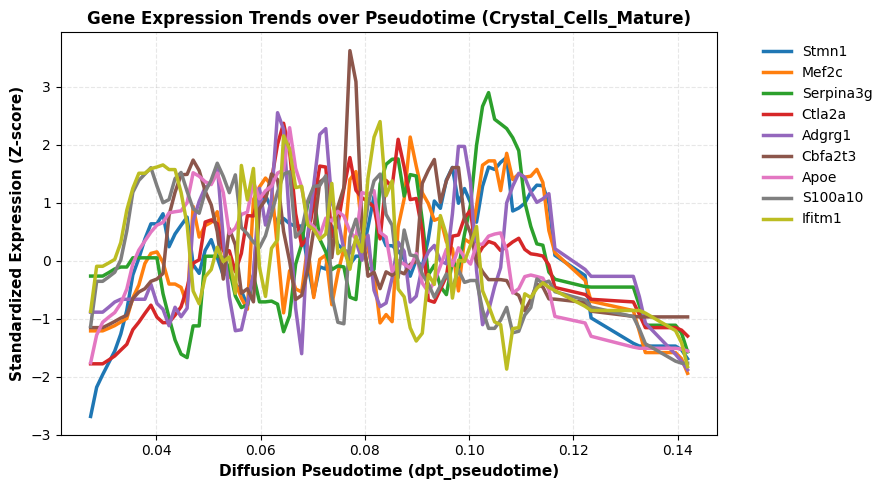

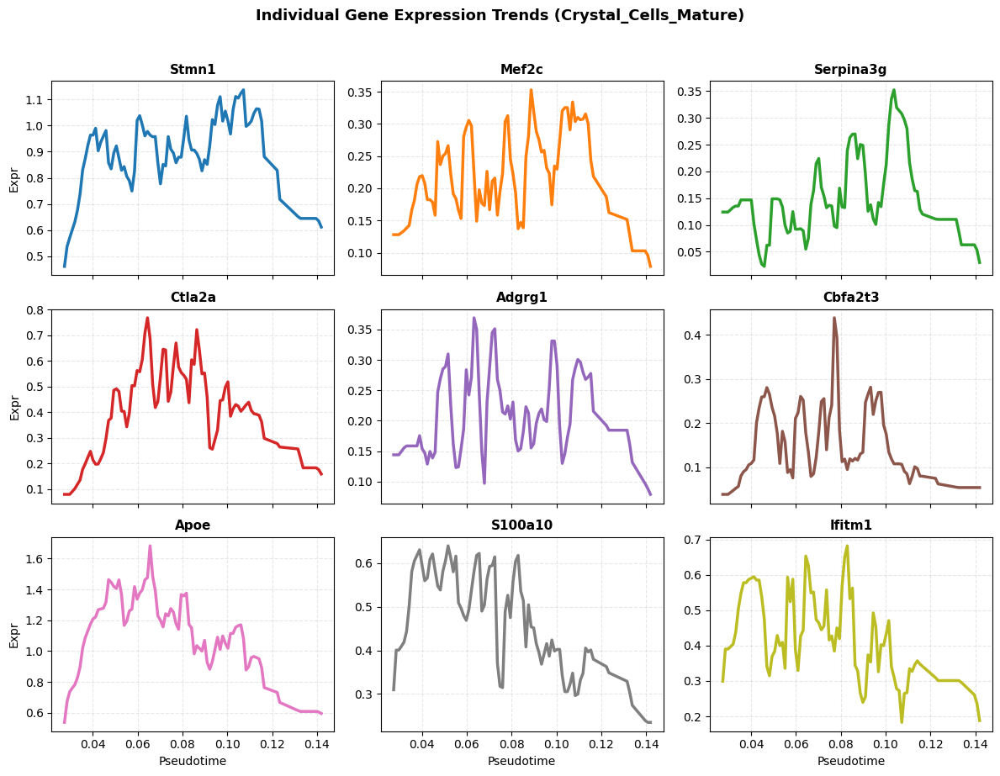

/usr/local/lib/python3.13/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [108]:
# Combine top filtered genes from each cluster
genes_to_plot = (
    late_genes_filt[:3] +
    mid_genes_filt[:3] +
    early_genes_filt[:3]
)

print("Plotting selected Drosophila driver genes:", genes_to_plot)

# 1. Overlay on a single plot (same_plot=True)
plot_drosophila_gene_trends(
    adata,
    genes=genes_to_plot,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    time_key='dpt_pseudotime',
    same_plot=True
)

# 2. Alternatively, view them in a grid of subplots (same_plot=False)
plot_drosophila_gene_trends(
    adata,
    genes=genes_to_plot,
    target_cluster='Crystal_Cells_Mature',
    cluster_key='annot_fly',
    time_key='dpt_pseudotime',
    same_plot=False,
    ncols=3
)